In [1]:
# importing libraries
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing 
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn import preprocessing

from sklearn.preprocessing import OneHotEncoder 
import random
import numpy as np
from sklearn.datasets import make_circles, make_moons
import matplotlib.pyplot as plt
import matplotlib
import numpy as np


from sklearn.metrics import f1_score, precision_score
from sklearn.datasets import make_circles, make_moons
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
 
import random
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch import Tensor
import torch.optim as optim
import torch.nn.functional as Fnc
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from IPython.core.debugger import set_trace
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib
from torch.autograd.variable import Variable
import sys
#################################################

# Loading Dataset

In [2]:
############################   DATA SET LOAD  #########################


### for sorting the the labeled data based on support
def sortingFunction(data):
    return data.shape[0]


#### label coding for nominal values
def label_coding(label):
    dataset[label]= label_encoder.fit_transform(dataset[label]) 
    dataset[label].unique()
    
### splitting dataset 
def crop_dataset(len_dataset):
    for label in range(len_dataset):
        temp_dataframe=dataset[dataset['label']==label]
        try:
            if temp_dataframe.shape[0]>8:
                _ ,temp_dataframe = train_test_split(temp_dataframe,test_size =.25)
            temp_train ,temp_test = train_test_split(temp_dataframe,test_size=0.25)
            list_train.append(temp_train)
            list_test.append(temp_test)
        except:
            print("Error for "+str(label))
        
### producing new samples        
def new_sample_generation(x,y,z):
    need=500-x if x<=500 else 0
    #print("n_sample: "+str(x)+" max_sample: "+str(y)+" need_to_create: "+str(need))
    
    
### importing dataset
dataset = pd.read_csv('kddcup99_csv.csv')

### label encoding
label_encoder = preprocessing.LabelEncoder() 
label_coding('protocol_type')
label_coding('service')
label_coding('flag')
label_coding('label')

### extracting features
X=dataset.iloc[:,:-1]
X=X.values
scaler = preprocessing.StandardScaler()
scaler.fit(X)
X=scaler.transform(X)


################################   PCA #####################################################
### dimention reduction

number_of_components=20
pca = PCA(n_components=number_of_components)
columns_array=[]
for i in range (number_of_components):
    columns_array.append("principal_Component"+str(i+1))
    
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
              , columns = columns_array)

finalDf = pd.concat([principalDf, dataset[['label']]], axis = 1)
dataset=finalDf

#############################  CROP DATA SET up to 15 Labels  ###########################
len_dataset= len(dataset.label.unique())
list_train,list_test=[],[]
    
crop_dataset(len_dataset)

list_train.sort(key=sortingFunction,reverse=True)
list_test.sort(key=sortingFunction,reverse=True)

train_dataframe=list_train[0]
test_dataframe=list_test[0]


# for taking top 15 labels
labels_to_consider = 15
max_samples = list_train[0].shape[0]

for i in range(1,labels_to_consider):
    new_sample_generation(len(list_train[i]),max_samples,int((max_samples-len(list_train[i]))*.5))
    train_dataframe=pd.concat([train_dataframe,list_train[i]])
    test_dataframe=pd.concat([test_dataframe,list_test[i]])
partial_dataframe=pd.concat([train_dataframe,test_dataframe])

#print(len(test_dataframe.label.unique()))

####################################  Generating Numpy Array X,y ###################

x_train=np.array(train_dataframe.iloc[:,:-1])
x_test=np.array(test_dataframe.iloc[:,:-1])
y_train=np.array(train_dataframe.iloc[:,-1])
y_test=np.array(test_dataframe.iloc[:,-1])   

n_sample: 20100 max_sample: 52648 need_to_create: 0
n_sample: 18240 max_sample: 52648 need_to_create: 0
n_sample: 413 max_sample: 52648 need_to_create: 87
n_sample: 298 max_sample: 52648 need_to_create: 202
n_sample: 234 max_sample: 52648 need_to_create: 266
n_sample: 195 max_sample: 52648 need_to_create: 305
n_sample: 191 max_sample: 52648 need_to_create: 309
n_sample: 183 max_sample: 52648 need_to_create: 317
n_sample: 49 max_sample: 52648 need_to_create: 451
n_sample: 43 max_sample: 52648 need_to_create: 457
n_sample: 10 max_sample: 52648 need_to_create: 490
n_sample: 6 max_sample: 52648 need_to_create: 494
n_sample: 6 max_sample: 52648 need_to_create: 494
n_sample: 5 max_sample: 52648 need_to_create: 495


In [5]:
### for extracting data from classification report
def CR_mat(y_true,y_pred):
    import re
    from sklearn.metrics import classification_report
    report=classification_report(y_true, y_pred)
    classification_list=[]
    lines=report.split("\n")[2:-5]
    for line in lines:
        line=re.sub(' +', ' ', line)
        words=line.split(" ")
        if len(words)<5:
            continue
        print(words)
        classification_list.append(words[1:])
    classification_mat=np.array(classification_list).astype(np.float)
    return classification_mat

# Intrusion Detection System

In [6]:
#####################   IDS ANN Model   ########################

class ANN(nn.Module):
   
    def __init__(self):
        super(ANN,self).__init__()
        
        nodes_layer_0 = 20
        nodes_layer_1 = 50
        nodes_layer_2 = 50
        nodes_layer_3 = 23
       
        # input has two features and
        self.layer1 = nn.Linear(nodes_layer_0,nodes_layer_1)
        self.layer2 = nn.Linear(nodes_layer_1,nodes_layer_2)
        self.layer3 = nn.Linear(nodes_layer_2,nodes_layer_3)

    #forward propagation    
    def forward(self,x):
        #output of layer 1       
        z1 = self.layer1(x)
        a1 = Fnc.tanh(z1)
        # output of layer 2
        z2 = self.layer2(a1)
        a2 = Fnc.tanh(z2)
        z3 = self.layer3(a2)
        
        return z3


In [7]:

####################  DATA LOADING   #####################

x_train = torch.from_numpy(x_train).type(torch.FloatTensor)
x_test = torch.from_numpy(x_test).type(torch.FloatTensor)

y_train = torch.from_numpy(y_train).type(torch.LongTensor)
y_test = torch.from_numpy(y_test).type(torch.LongTensor)

Training_data = [(x, y) for x, y in zip(x_train,y_train)]
Testing_data = [(x, y) for x, y in zip(x_test,y_test)]
        
class Data_Loader():
    
    def __init__(self,data_list):       
        self.data=data_list
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        img = self.data[index][0]
        img_tensor = Tensor(img).float()
        label = self.data[index][1]
        return (img_tensor, label)

#######################  Train and Test Data Set  ##########################

Training_DataSet=Data_Loader(Training_data)
Testing_DataSet=Data_Loader(Testing_data)

train_loader = DataLoader(dataset=Training_DataSet, batch_size=5000, shuffle=True)
testing_loader = DataLoader(dataset=Testing_DataSet, batch_size=len(Testing_DataSet), shuffle=True)


C:\Users\AcydLAB\Anaconda3\lib\site-packages\torch\nn\functional.py:1340: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
C:\Users\AcydLAB\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\AcydLAB\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\AcydLAB\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


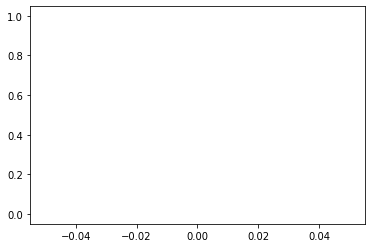

C:\Users\AcydLAB\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.00', '0.00', '0.00', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.97', '1.00', '0.98', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.93', '0.96', '0.94', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.00', '0.00', '0.00', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.98', '0.90', '0.94', '62']
['', '21', '0.00', '0.00', '0.00', '64']


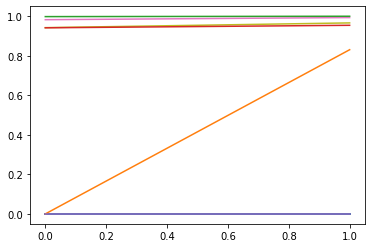

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.00', '0.00', '0.00', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.99', '1.00', '0.99', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.94', '0.99', '0.97', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '1.00', '0.71', '0.83', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.00', '0.00', '0.00', '64']


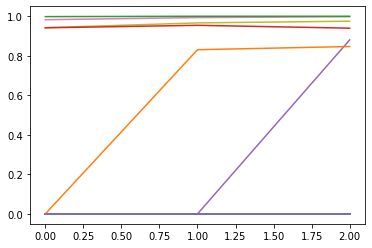

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.92', '0.85', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.99', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.95', '1.00', '0.97', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.90', '0.80', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.00', '0.00', '0.00', '64']


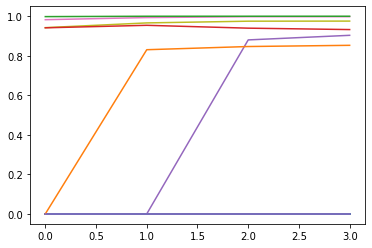

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.91', '0.90', '0.90', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.99', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.95', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


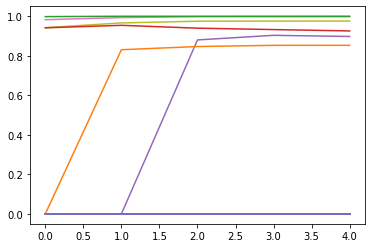

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.90', '0.90', '0.90', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.99', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.95', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


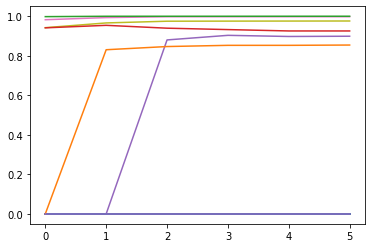

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.89', '0.91', '0.90', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '0.99', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.89', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


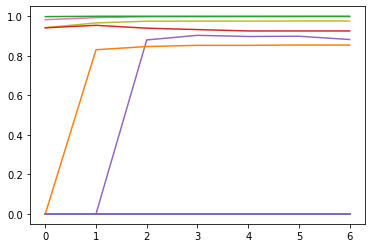

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.86', '0.91', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.89', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


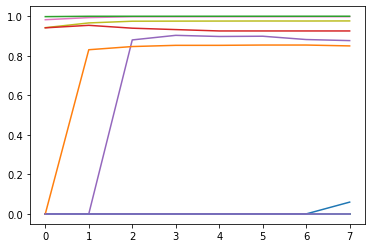

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.85', '0.91', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.03', '0.06', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


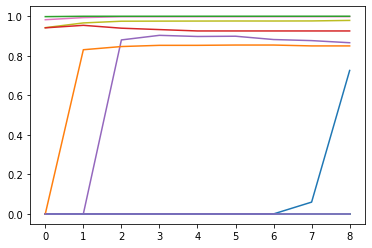

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.83', '0.91', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.57', '0.73', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.00', '0.00', '0.00', '64']


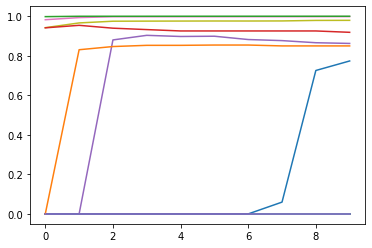

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.81', '0.92', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.63', '0.77', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


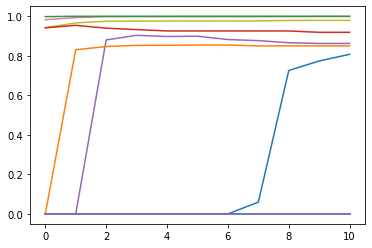

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.81', '0.92', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '1.00', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.68', '0.81', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


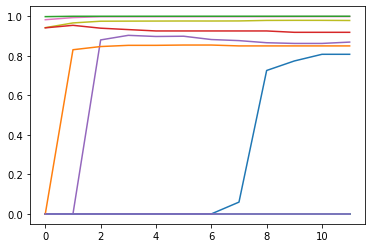

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.81', '0.94', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.96', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.68', '0.81', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


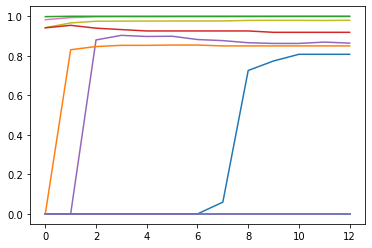

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.80', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.97', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.68', '0.81', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


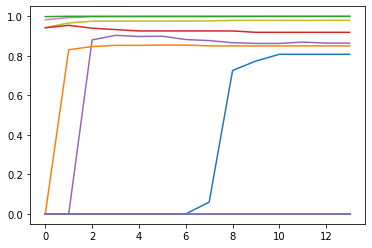

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.80', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.97', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.68', '0.81', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


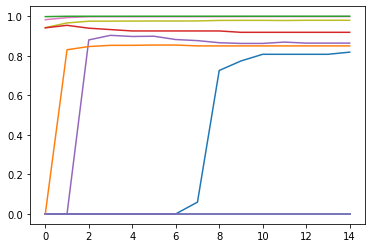

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.80', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.97', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.69', '0.82', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '0.00', '0.00', '0.00', '64']


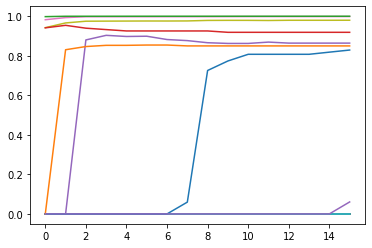

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.80', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.97', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.71', '0.83', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.03', '0.06', '64']


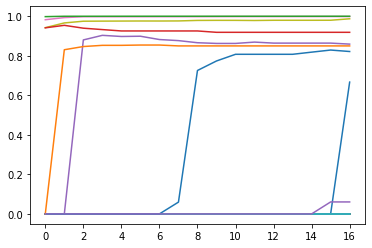

['', '0', '0.67', '0.67', '0.67', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.79', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.98', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.71', '0.82', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.03', '0.06', '64']


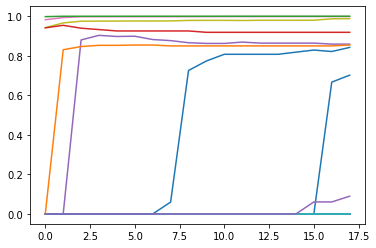

['', '0', '0.68', '0.72', '0.70', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.79', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.98', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.74', '0.84', '65']
['', '17', '0.89', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.05', '0.09', '64']


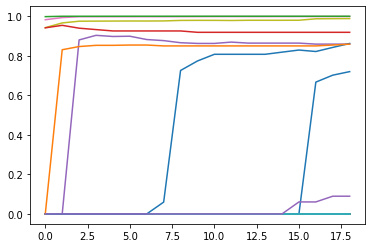

['', '0', '0.69', '0.75', '0.72', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.79', '0.94', '0.86', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.98', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.05', '0.09', '64']


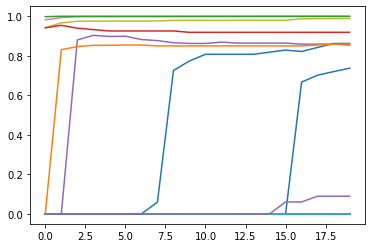

['', '0', '0.70', '0.78', '0.74', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.78', '0.94', '0.85', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.98', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.05', '0.09', '64']


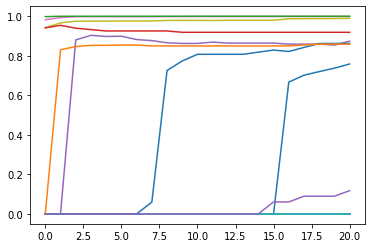

['', '0', '0.71', '0.82', '0.76', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.79', '0.97', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.06', '0.12', '64']


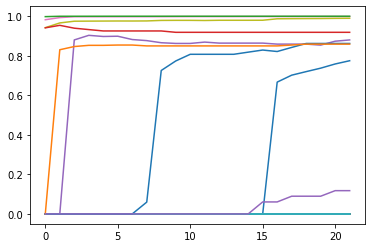

['', '0', '0.71', '0.85', '0.77', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.06', '0.12', '64']


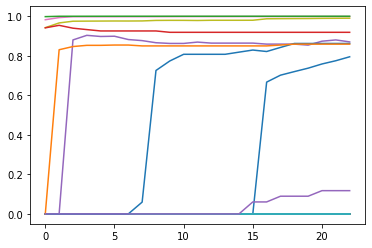

['', '0', '0.72', '0.88', '0.79', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.78', '0.99', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.06', '0.12', '64']


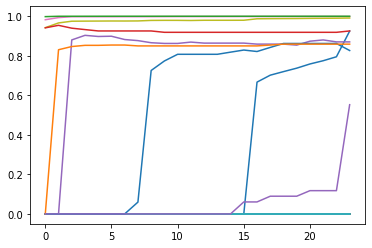

['', '0', '0.91', '0.93', '0.92', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.78', '0.99', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.89', '0.77', '0.83', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.71', '0.45', '0.55', '64']


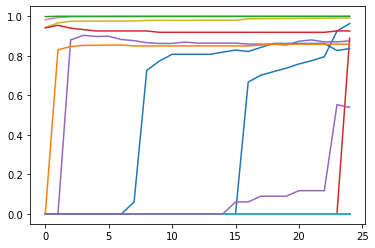

['', '0', '0.98', '0.94', '0.96', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.89', '0.78', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.61', '0.48', '0.54', '64']


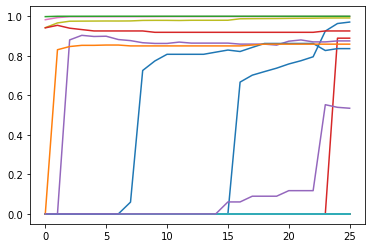

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.89', '0.78', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.60', '0.48', '0.53', '64']


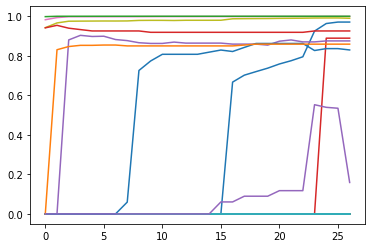

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.88', '0.78', '0.83', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.29', '0.11', '0.16', '64']


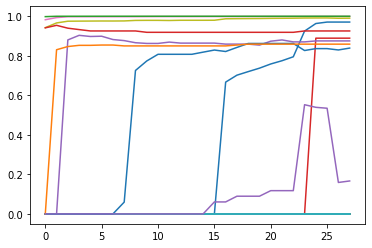

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.35', '0.11', '0.17', '64']


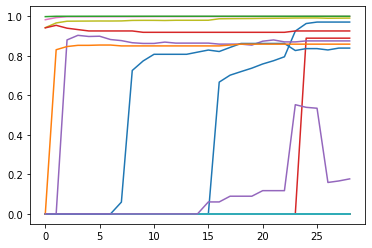

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.47', '0.11', '0.18', '64']


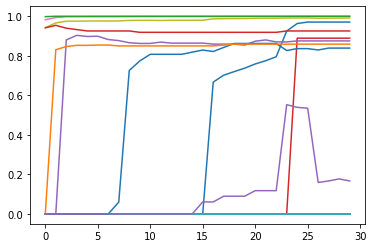

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.86', '1.00', '0.93', '62']
['', '21', '0.75', '0.09', '0.17', '64']


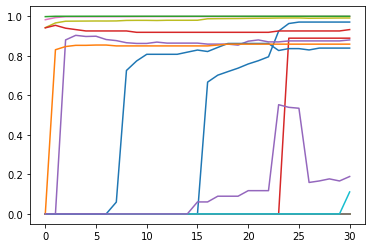

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.06', '0.11', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.70', '0.11', '0.19', '64']


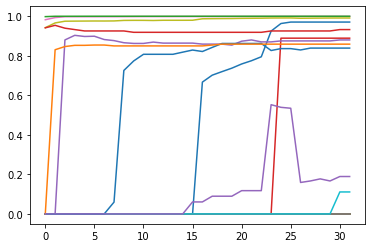

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.06', '0.11', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.70', '0.11', '0.19', '64']


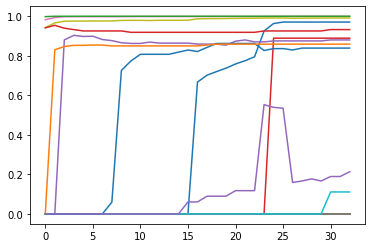

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.79', '0.99', '0.88', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.06', '0.11', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.73', '0.12', '0.21', '64']


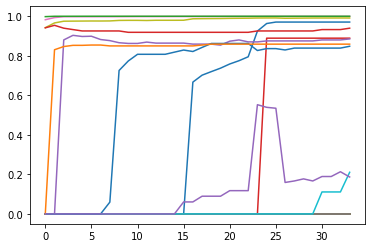

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.80', '0.99', '0.89', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.12', '0.21', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.64', '0.11', '0.19', '64']


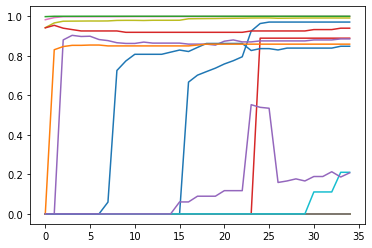

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.80', '0.99', '0.89', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.12', '0.21', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.62', '0.12', '0.21', '64']


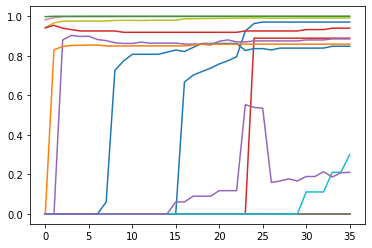

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.80', '0.99', '0.89', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.18', '0.30', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.67', '0.12', '0.21', '64']


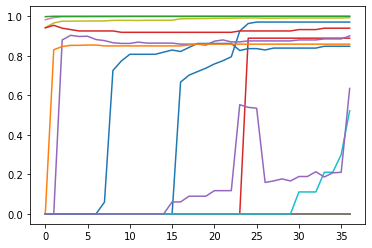

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.83', '0.99', '0.90', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.35', '0.52', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.82', '0.52', '0.63', '64']


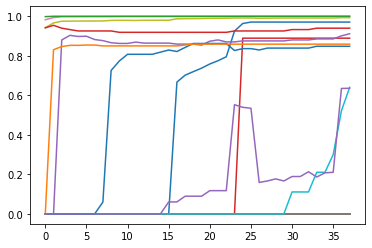

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.79', '0.53', '0.64', '64']


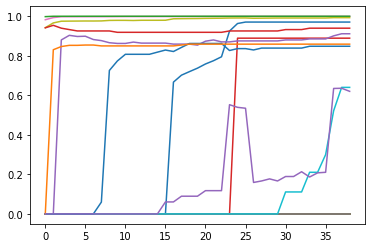

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.86', '0.48', '0.62', '64']


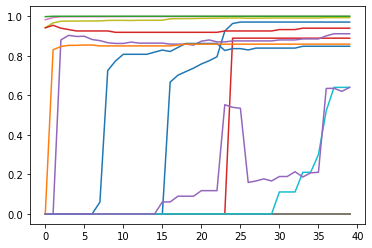

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.89', '0.50', '0.64', '64']


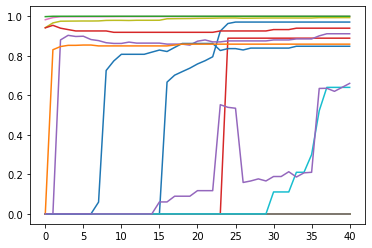

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.53', '0.66', '64']


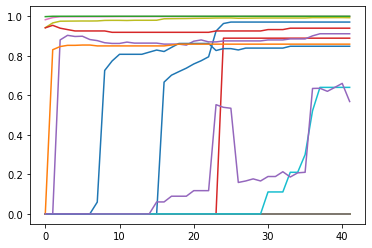

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.42', '0.57', '64']


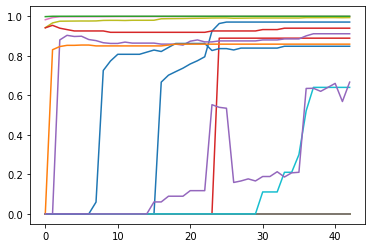

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.89', '0.53', '0.67', '64']


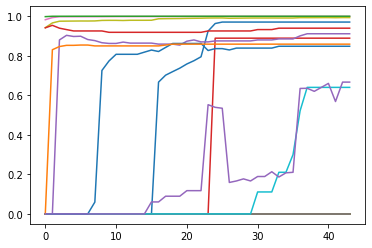

['', '0', '0.99', '0.95', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.89', '0.53', '0.67', '64']


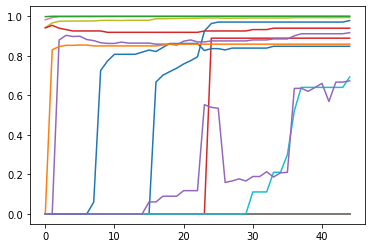

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.88', '0.55', '0.67', '64']


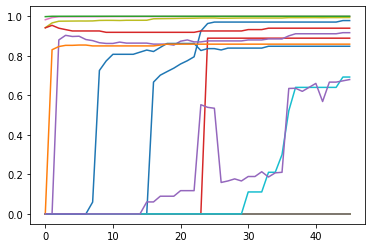

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.55', '0.68', '64']


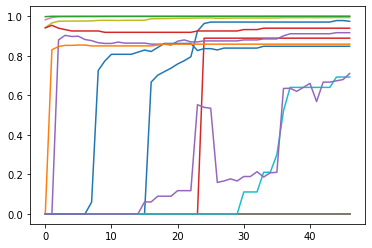

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.88', '0.59', '0.71', '64']


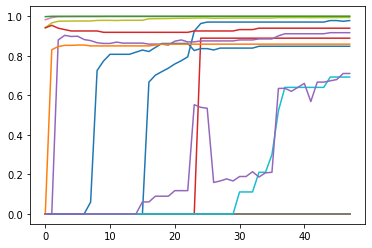

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.88', '0.59', '0.71', '64']


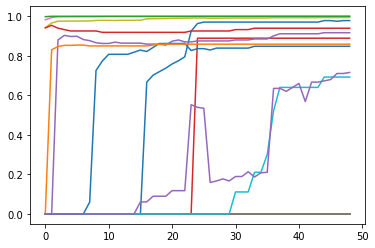

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.61', '0.72', '64']


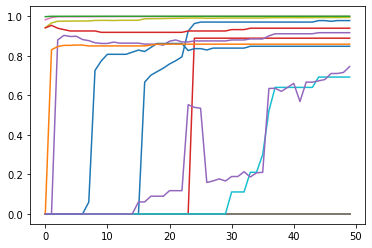

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.89', '0.64', '0.75', '64']


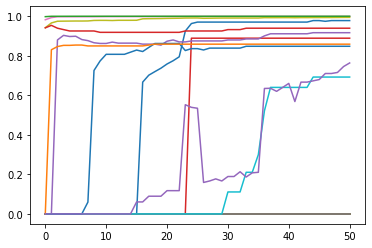

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.82', '0.85', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.91', '0.66', '0.76', '64']


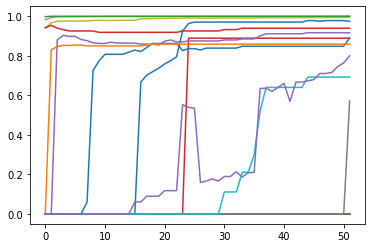

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.72', '0.80', '64']


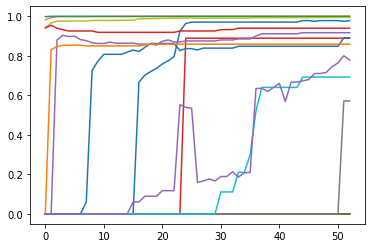

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.69', '0.78', '64']


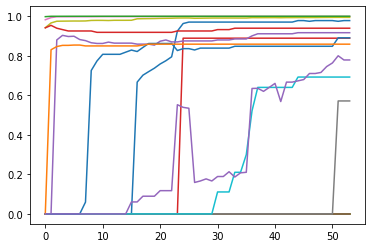

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.69', '0.78', '64']


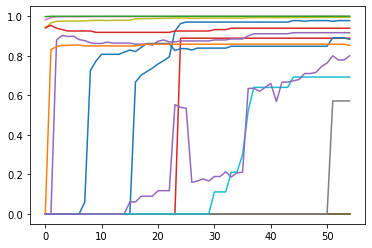

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.72', '0.80', '64']


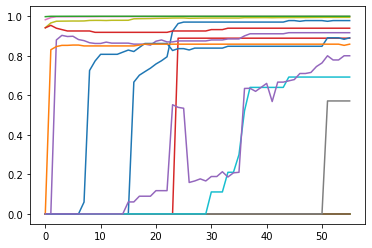

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.72', '0.80', '64']


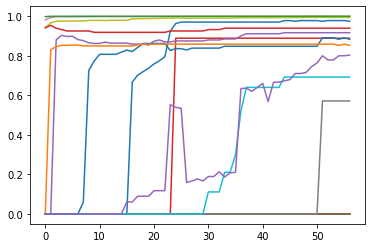

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.89', '0.73', '0.80', '64']


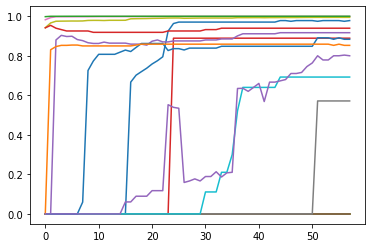

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.90', '0.72', '0.80', '64']


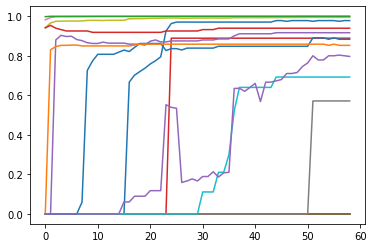

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.73', '0.80', '64']


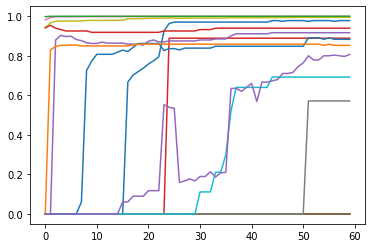

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.75', '0.81', '64']


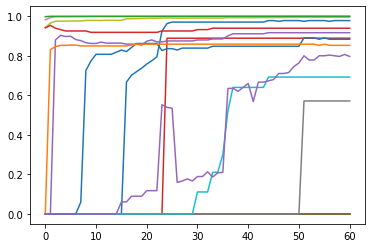

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.73', '0.80', '64']


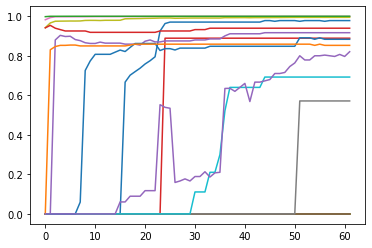

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.91', '0.75', '0.82', '64']


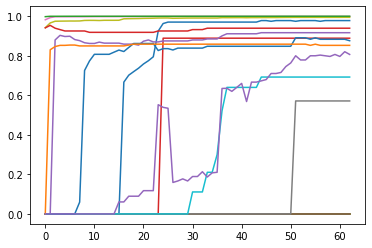

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.95', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.75', '0.81', '64']


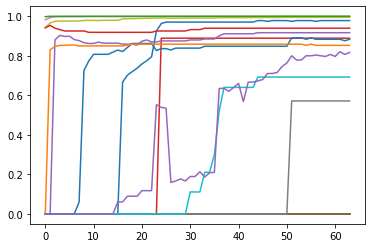

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.88', '0.77', '0.82', '64']


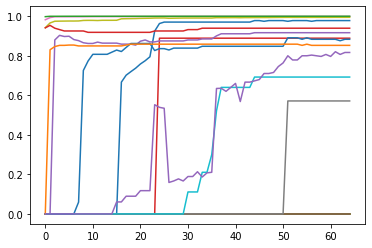

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.88', '0.77', '0.82', '64']


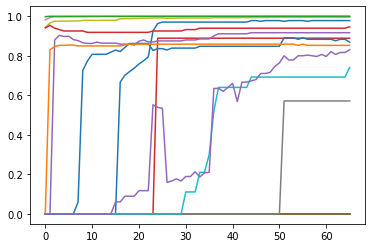

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.86', '0.99', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '1.00', '0.40', '0.57', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.59', '0.74', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.81', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.90', '1.00', '0.95', '62']
['', '21', '0.91', '0.77', '0.83', '64']


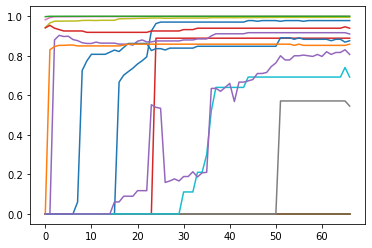

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.97', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.40', '0.55', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.95', '0.82', '0.88', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.87', '0.75', '0.81', '64']


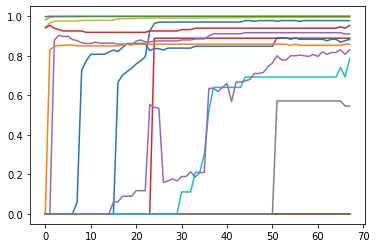

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.97', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.40', '0.55', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.91', '0.77', '0.83', '64']


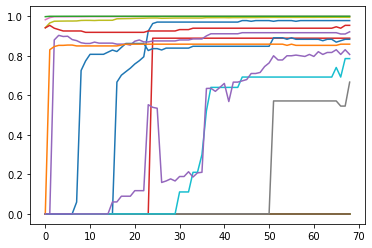

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.87', '0.97', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.89', '0.53', '0.67', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.96', '0.82', '0.88', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.87', '0.75', '0.81', '64']


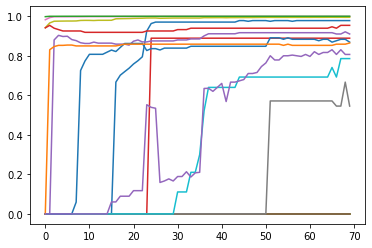

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.85', '0.97', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.40', '0.55', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.87', '0.75', '0.81', '64']


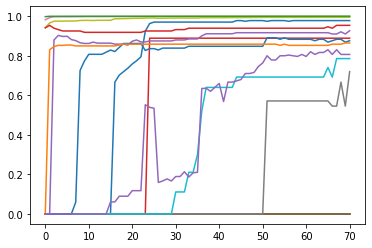

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.95', '0.82', '0.88', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.87', '0.75', '0.81', '64']


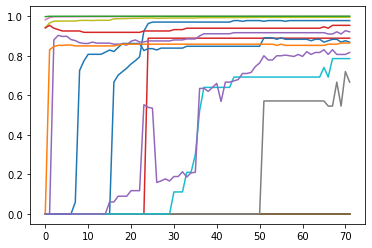

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.87', '0.97', '0.92', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.89', '0.53', '0.67', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.77', '0.82', '64']


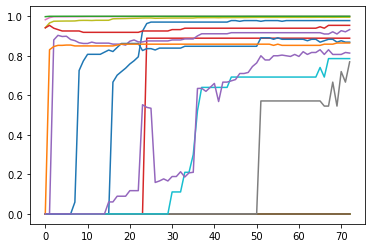

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.91', '0.67', '0.77', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.75', '0.81', '64']


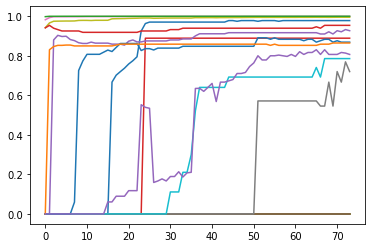

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.87', '0.75', '0.81', '64']


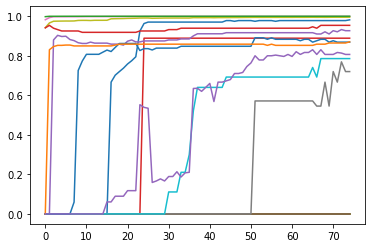

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.84', '0.87', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.87', '0.75', '0.81', '64']


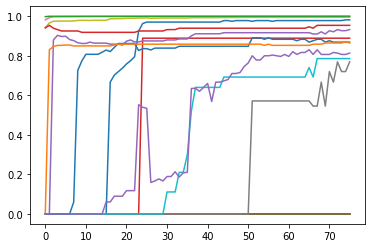

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.91', '0.67', '0.77', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.83', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.75', '0.81', '64']


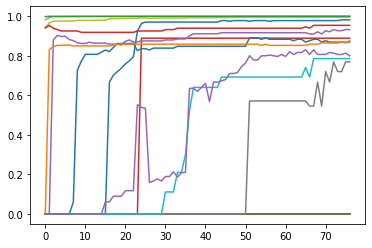

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.91', '0.67', '0.77', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.75', '0.80', '64']


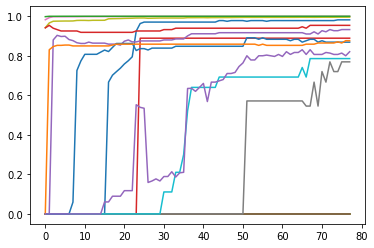

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.91', '0.67', '0.77', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.91', '0.75', '0.82', '64']


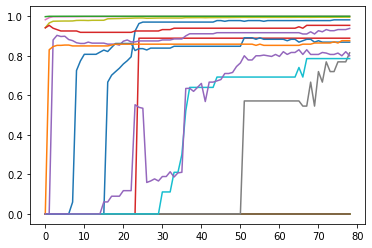

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.75', '0.80', '64']


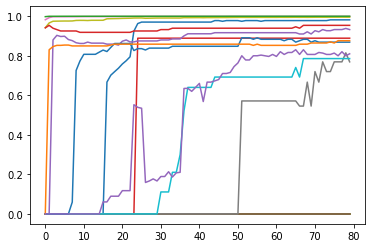

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.91', '0.67', '0.77', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.77', '0.81', '64']


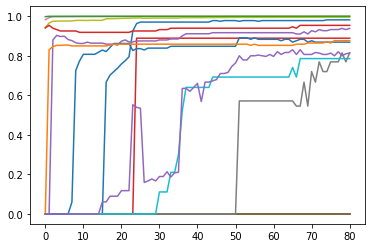

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.75', '0.81', '64']


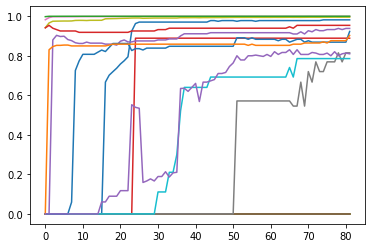

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.84', '0.90', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.77', '0.81', '64']


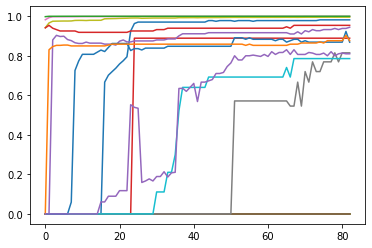

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.77', '0.81', '64']


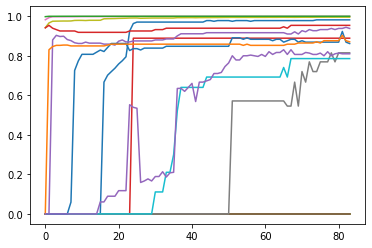

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.91', '0.82', '0.86', '65']
['', '17', '0.90', '0.84', '0.87', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.86', '0.77', '0.81', '64']


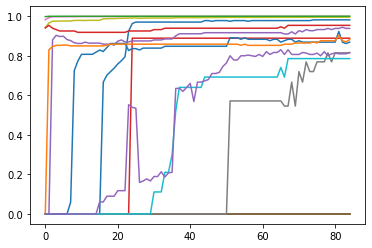

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.86', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.77', '0.82', '64']


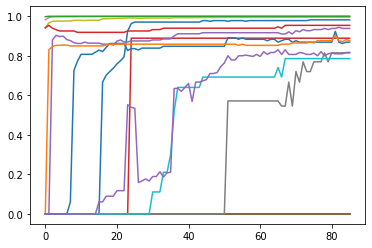

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.90', '0.85', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.77', '0.82', '64']


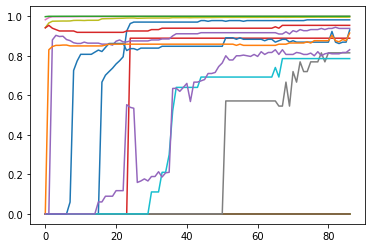

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.86', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.91', '0.77', '0.83', '64']


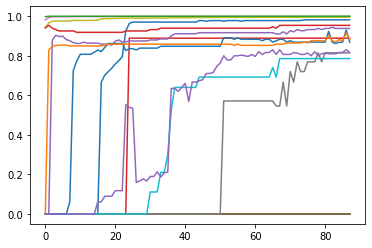

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.86', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.77', '0.82', '64']


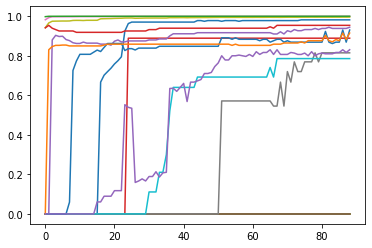

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.86', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.91', '0.77', '0.83', '64']


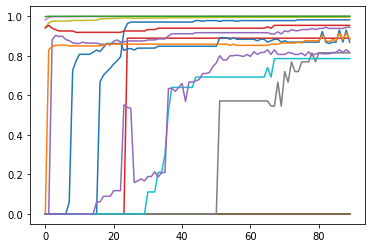

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.86', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.77', '0.82', '64']


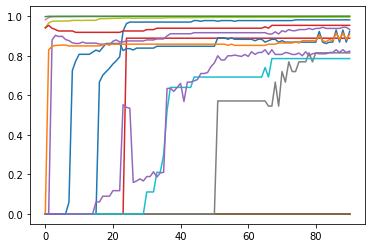

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.85', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.77', '0.82', '64']


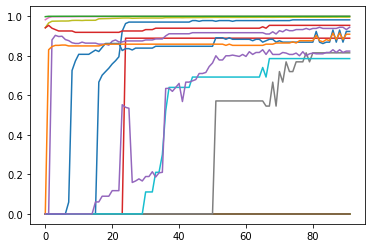

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.85', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.77', '0.82', '64']


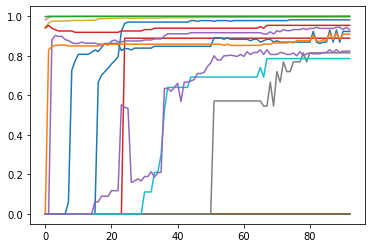

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.85', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.77', '0.82', '64']


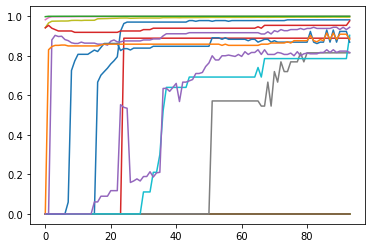

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.82', '0.90', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.86', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.95', '1.00', '0.98', '62']
['', '21', '0.88', '0.77', '0.82', '64']


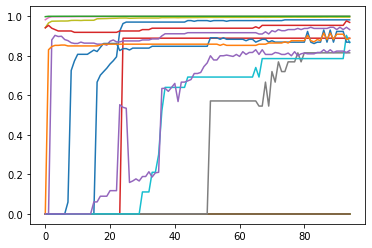

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.76', '0.87', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.87', '0.89', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.94', '1.00', '0.97', '62']
['', '21', '0.88', '0.78', '0.83', '64']


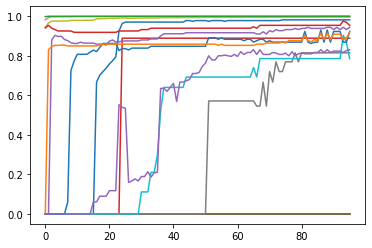

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.87', '0.92', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.91', '0.77', '0.83', '64']


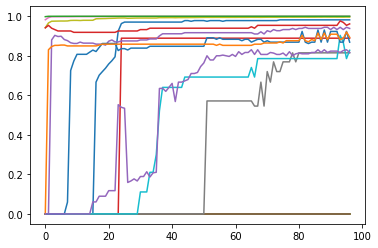

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.71', '0.83', '17']
['', '15', '0.93', '0.82', '0.87', '65']
['', '17', '0.91', '0.88', '0.89', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.93', '1.00', '0.96', '62']
['', '21', '0.88', '0.77', '0.82', '64']


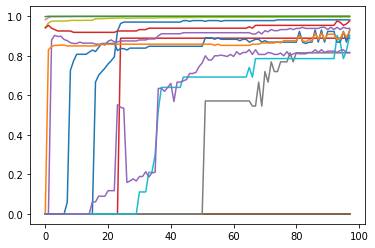

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.82', '0.90', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.95', '1.00', '0.98', '62']
['', '21', '0.88', '0.77', '0.82', '64']


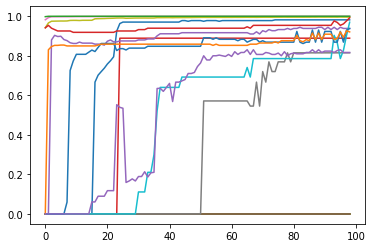

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.94', '0.97', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.87', '0.92', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.98', '1.00', '0.99', '62']
['', '21', '0.88', '0.77', '0.82', '64']


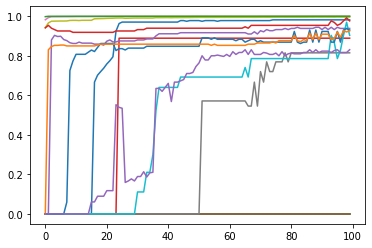

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.82', '0.90', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.95', '1.00', '0.98', '62']
['', '21', '0.91', '0.77', '0.83', '64']


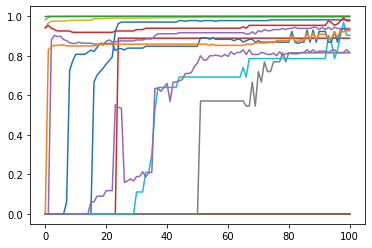

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.82', '0.90', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.95', '1.00', '0.98', '62']
['', '21', '0.88', '0.77', '0.82', '64']


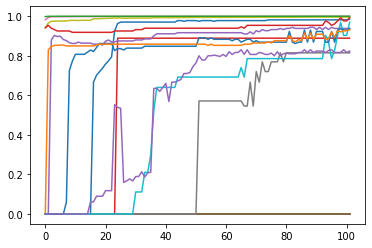

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.94', '0.97', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.89', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.98', '1.00', '0.99', '62']
['', '21', '0.89', '0.77', '0.82', '64']


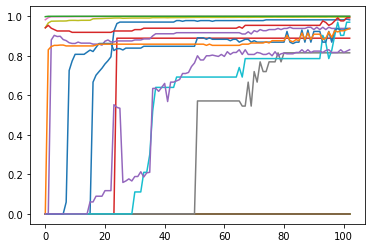

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.94', '0.97', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.98', '1.00', '0.99', '62']
['', '21', '0.91', '0.77', '0.83', '64']


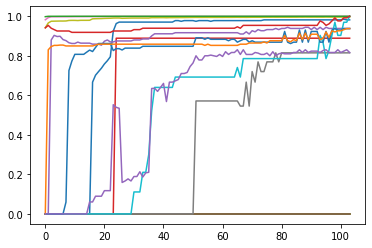

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.77', '0.82', '64']


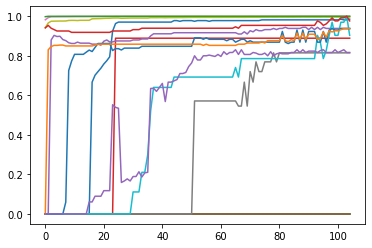

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.82', '0.90', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.95', '1.00', '0.98', '62']
['', '21', '0.88', '0.77', '0.82', '64']


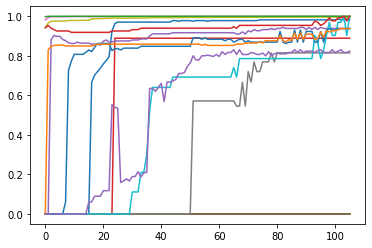

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.77', '0.82', '64']


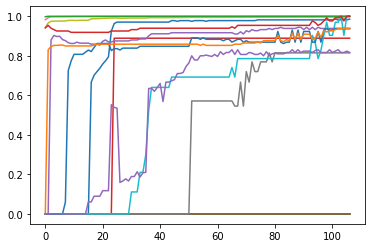

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.77', '0.82', '64']


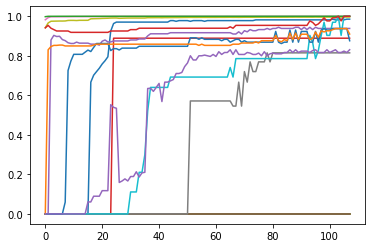

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.82', '0.88', '65']
['', '17', '0.91', '0.91', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.77', '0.83', '64']


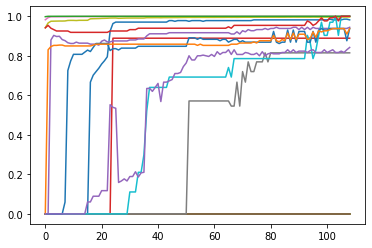

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.75', '0.84', '64']


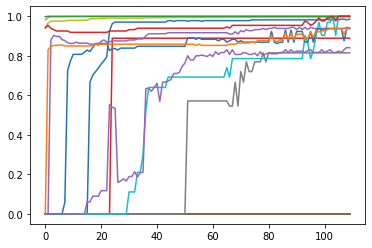

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.78', '0.84', '64']


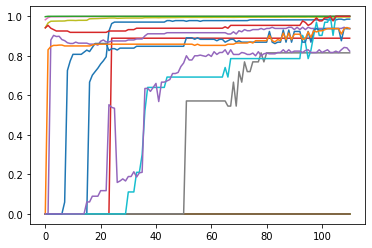

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.77', '0.82', '64']


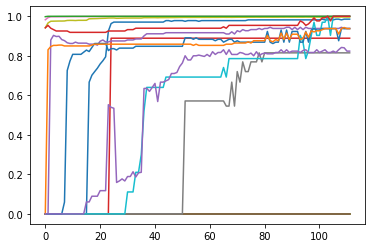

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.77', '0.82', '64']


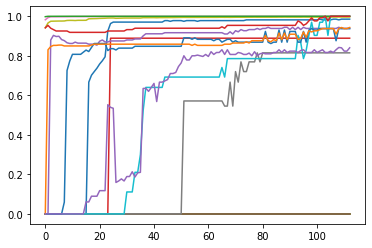

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.78', '0.84', '64']


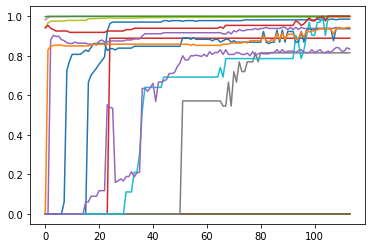

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.78', '0.83', '64']


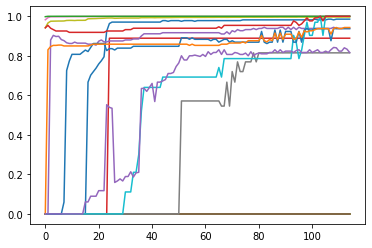

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.77', '0.82', '64']


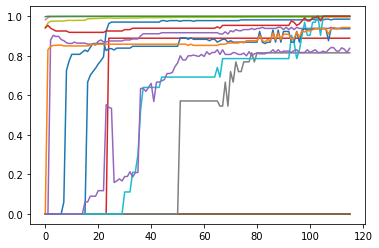

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.77', '0.84', '64']


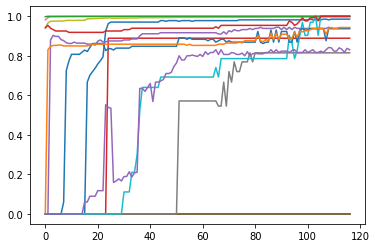

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.77', '0.83', '64']


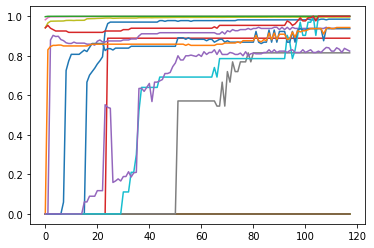

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.77', '0.82', '64']


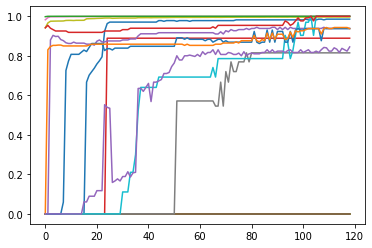

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.77', '0.84', '64']


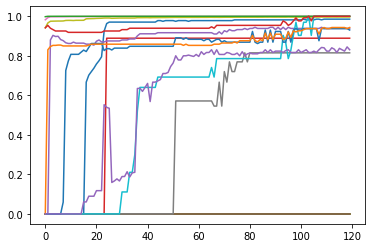

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.77', '0.83', '64']


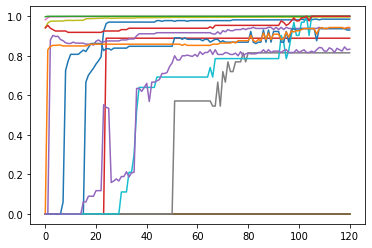

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.78', '0.83', '64']


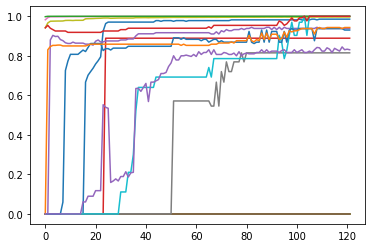

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.77', '0.83', '64']


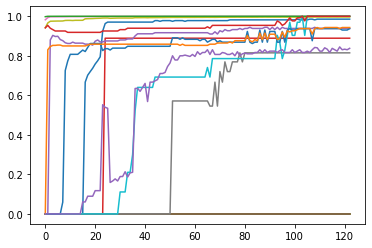

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.77', '0.84', '64']


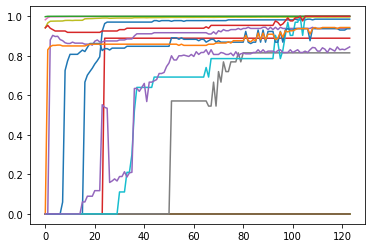

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.77', '0.84', '64']


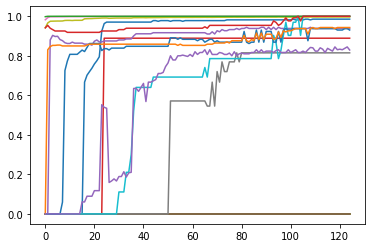

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.86', '0.80', '0.83', '64']


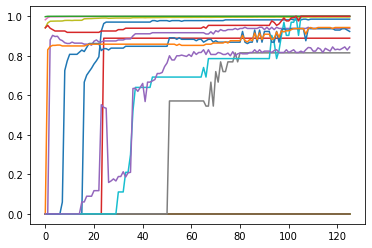

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.77', '0.84', '64']


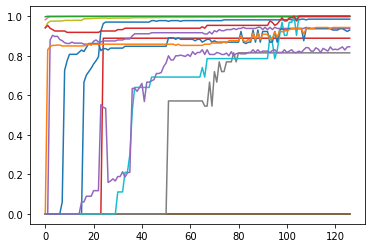

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


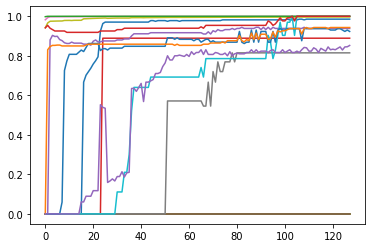

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.77', '0.85', '64']


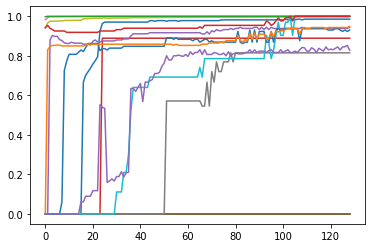

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.75', '0.83', '64']


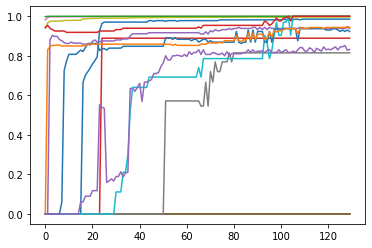

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.92', '0.92', '0.92', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.85', '0.81', '0.83', '64']


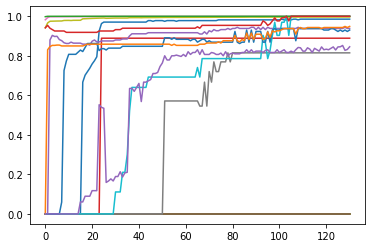

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


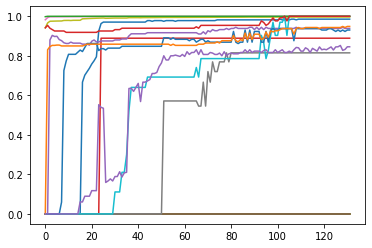

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


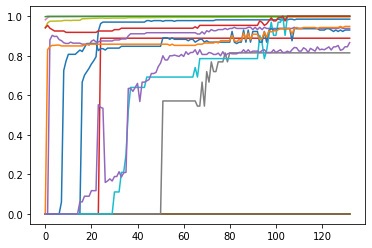

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


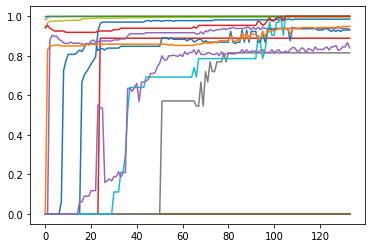

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.78', '0.84', '64']


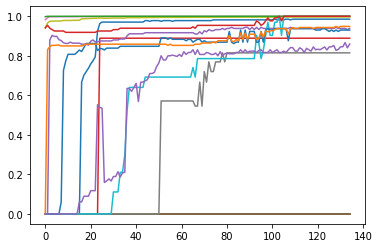

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


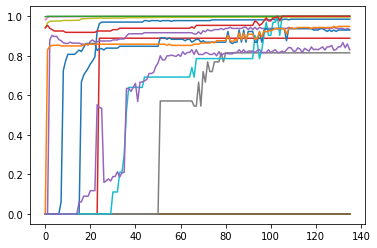

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.77', '0.83', '64']


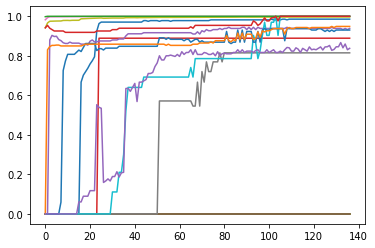

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.77', '0.84', '64']


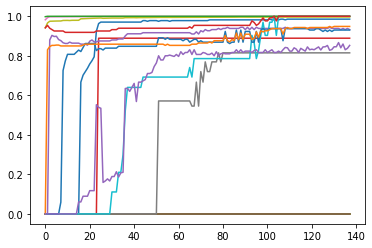

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.81', '0.85', '64']


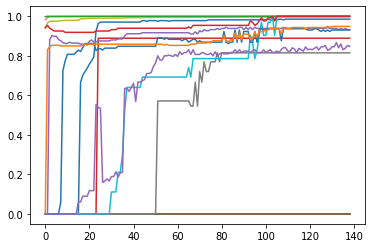

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.78', '0.85', '64']


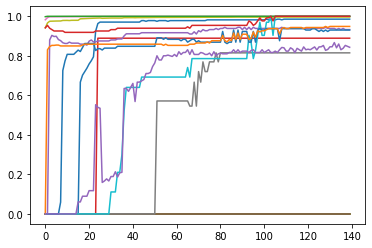

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.80', '0.84', '64']


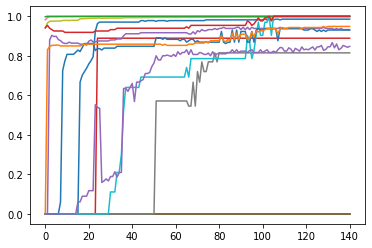

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.78', '0.85', '64']


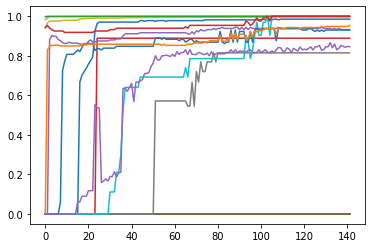

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


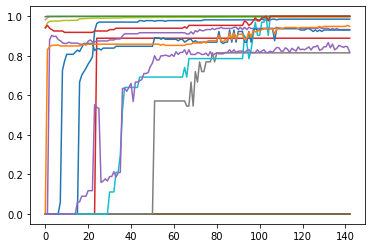

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.92', '0.93', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.83', '0.81', '0.82', '64']


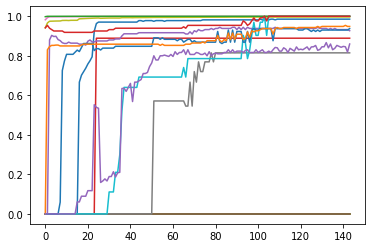

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


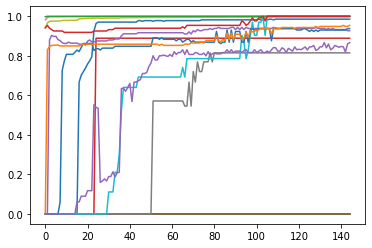

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


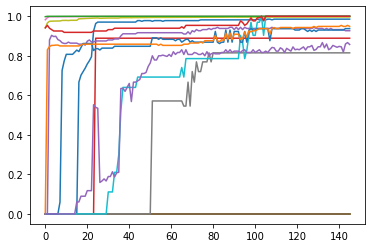

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.80', '0.86', '64']


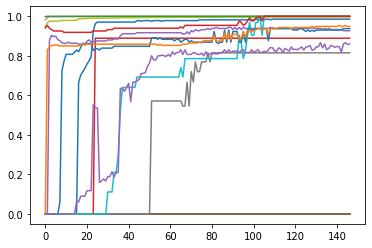

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


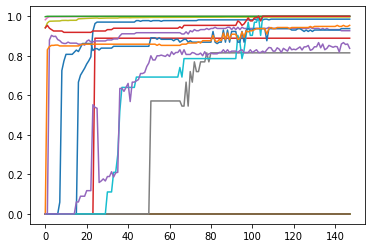

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.77', '0.84', '64']


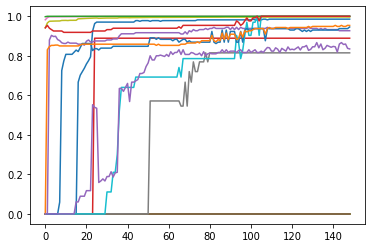

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.84', '0.83', '0.83', '64']


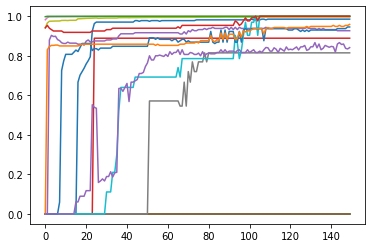

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.85', '0.83', '0.84', '64']


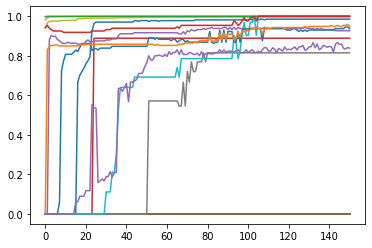

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.87', '0.81', '0.84', '64']


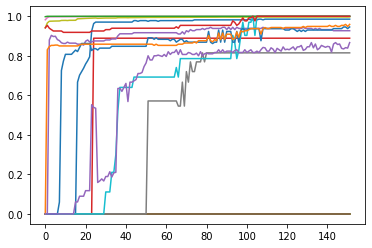

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


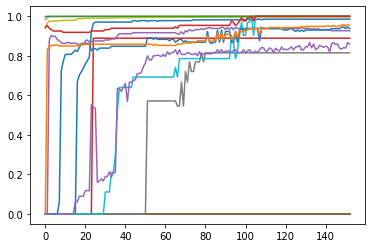

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


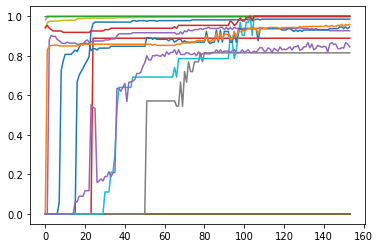

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


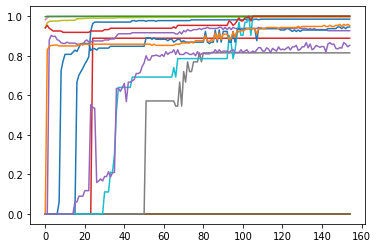

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.81', '0.85', '64']


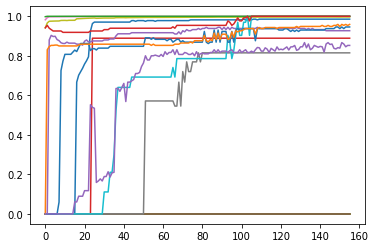

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.81', '0.85', '64']


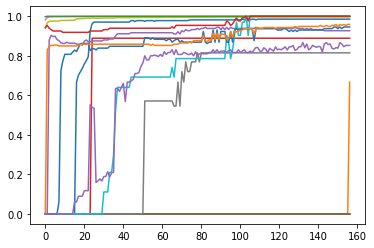

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.81', '0.85', '64']


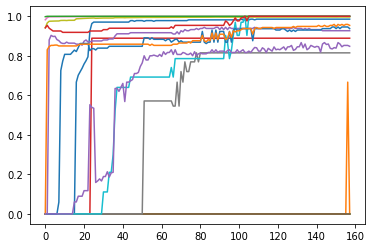

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.87', '0.83', '0.85', '64']


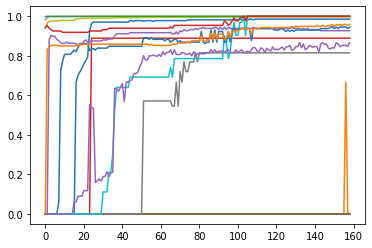

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


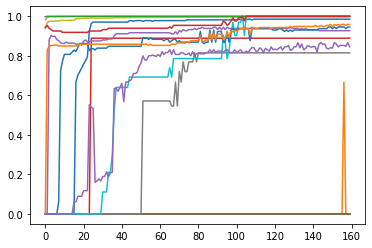

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.81', '0.85', '64']


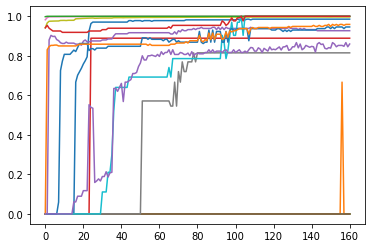

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


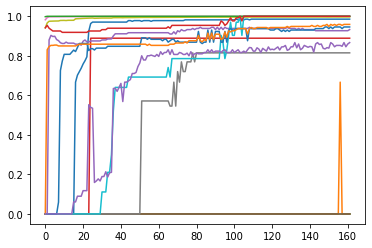

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


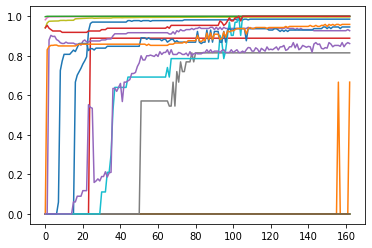

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.83', '0.86', '64']


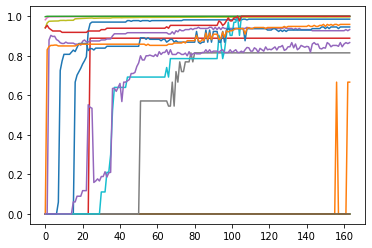

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


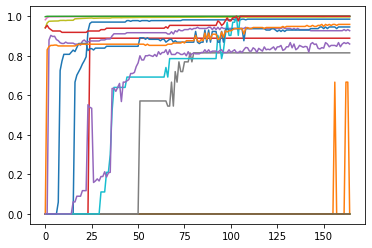

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


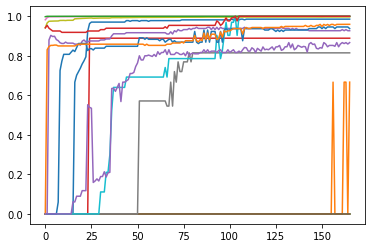

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


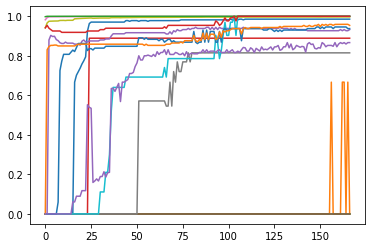

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


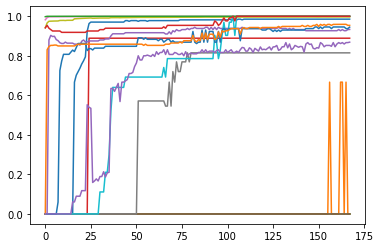

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.99', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.83', '0.87', '64']


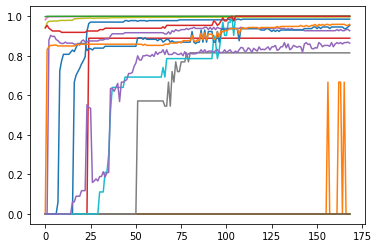

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.88', '0.97', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.84', '0.86', '64']


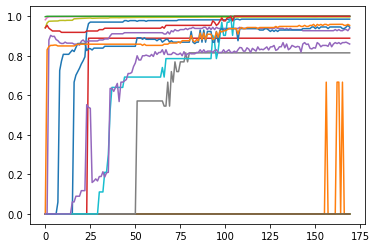

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


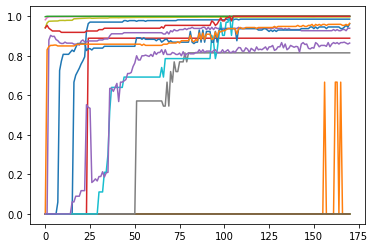

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.80', '0.86', '64']


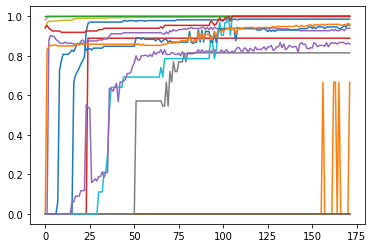

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.94', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.81', '0.86', '64']


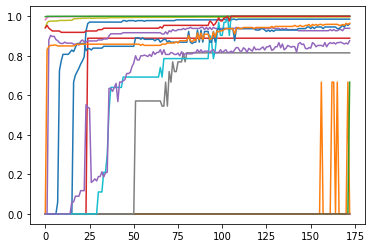

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.83', '0.88', '64']


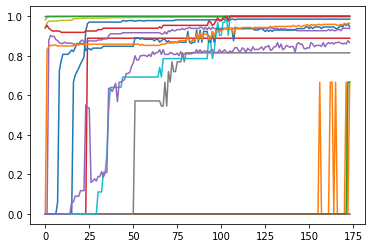

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.94', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


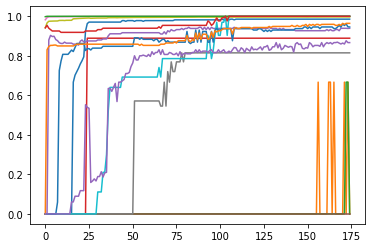

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


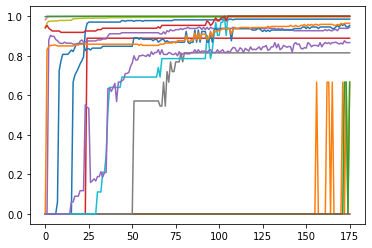

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


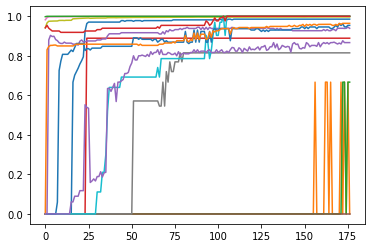

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


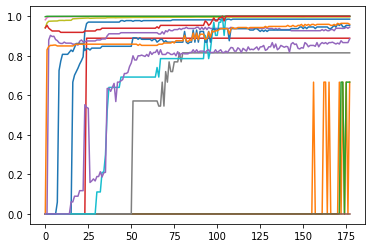

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.84', '0.89', '64']


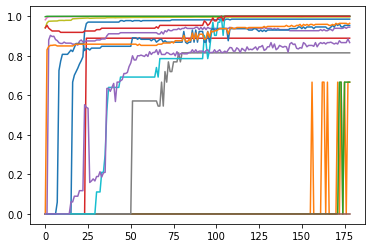

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.81', '0.87', '64']


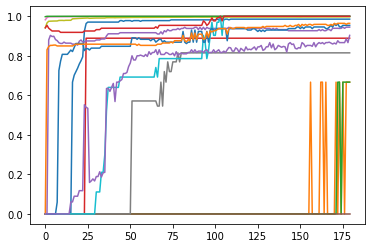

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.88', '0.90', '64']


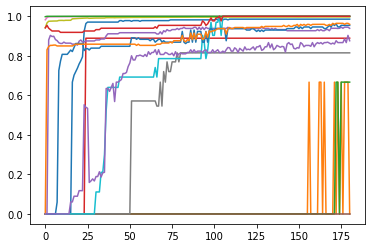

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.83', '0.88', '64']


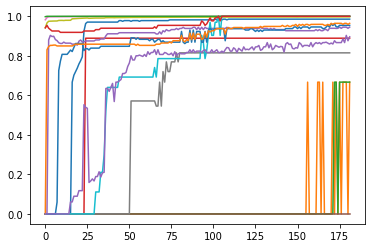

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.88', '0.90', '64']


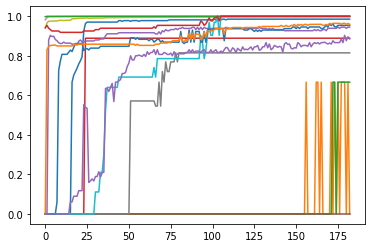

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.84', '0.89', '64']


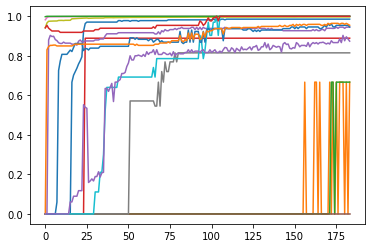

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.97', '0.94', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.81', '0.87', '64']


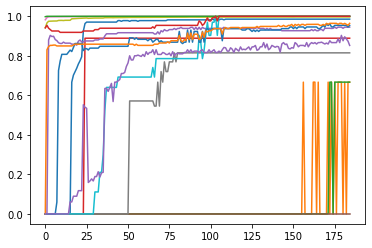

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.81', '0.85', '64']


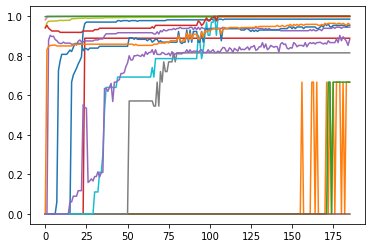

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.81', '0.88', '64']


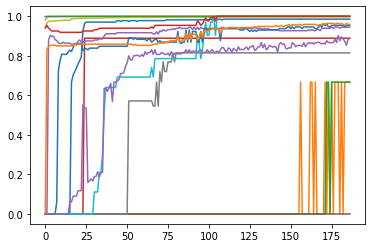

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.81', '0.89', '64']


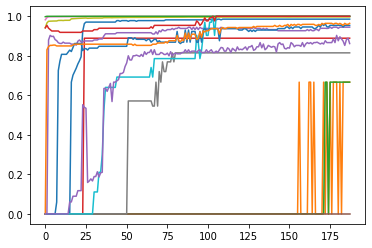

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.83', '0.86', '64']


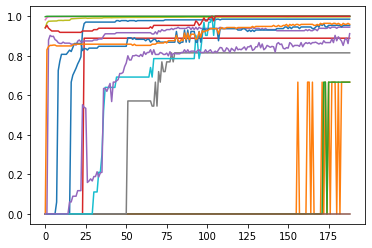

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.89', '0.91', '64']


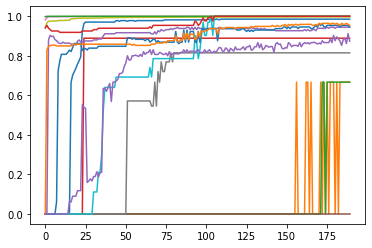

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.97', '0.94', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.81', '0.87', '64']


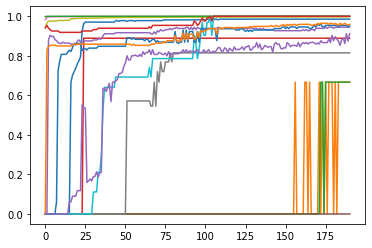

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.89', '0.91', '64']


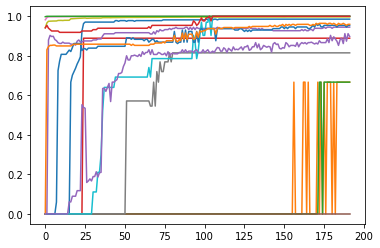

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.89', '0.90', '64']


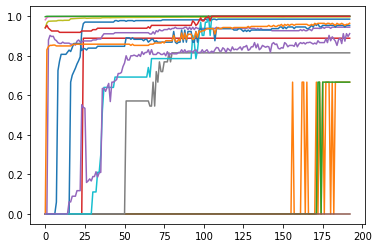

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.95', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.89', '0.91', '64']


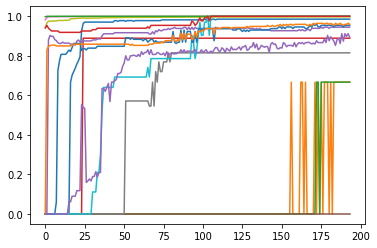

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.86', '0.89', '64']


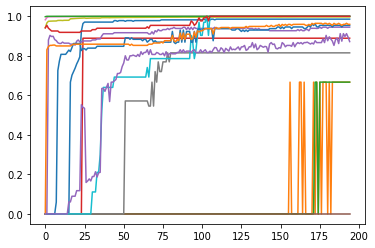

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.80', '0.87', '64']


In [8]:
########################## Running IDS Model ######################    
maxEpochforIDS=200
model = ANN()
F1_list_before=[]
Pre_list=[]
Report_before=[]

 
optimizer = optim.Adam(model.parameters(), lr = 0.001)
criterion = nn.CrossEntropyLoss()



for epoch in range(maxEpochforIDS):
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    for batch_idx, (x, target) in enumerate(train_loader):
        optimizer.zero_grad()
        out = model(x)
        loss = criterion(out, target)
        _, pred_label = torch.max(out.data, 1)
        total_cnt += x.shape[0]
        correct_cnt+= (pred_label == target).sum().item()
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
        loss.backward()
        optimizer.step()
        if (epoch+1) % 20 == 0 or (batch_idx+1) == len(train_loader):
            continue
            print('==>>> epoch: {}, batch index: {}, train loss: {:.6f}, acc: {:.3f}'.format(
                epoch, batch_idx+1, ave_loss, correct_cnt*1.0/total_cnt))
    # testing
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    
    
    for batch_idx, (x, target) in enumerate(testing_loader):
        #print(batch_idx,x.shape, target.shape)
        out = model(x)
        loss = criterion(out, target)
        _, pred_label = torch.max(out.data, 1)
        total_cnt += x.shape[0]
#       print(target.data)
        correct_cnt += (pred_label == target).sum().item()
        # smooth average
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
       
        if(epoch+1) % 1 == 0 or (batch_idx+1) == len(testing_loader):
            F1= f1_score(target, pred_label, average=None)
            Pre=precision_score(target, pred_label, average=None)
            #Precission=precision_score(target, pred_label, average='macro')


            #print('==>>> epoch: {}, batch index: {}, test loss: {:.6f},'.format(
                #epoch, batch_idx+1, ave_loss, correct_cnt * 1.0 / total_cnt))
            #print('F1',F1)
            if np.array(F1).size!=labels_to_consider:
                continue
            F1_list_before.append(np.array(F1))
            Pre_list.append(Pre)
            plt.plot()
            plt.plot(F1_list_before)
            plt.show()
            ################################
            y_true =target
            y_pred = pred_label
            Report_before.append(CR_mat(y_true,y_pred))
#########################################################################################


In [10]:
##################  EVALUATING PERFORMANCE of IDS ########################

from sklearn.metrics import classification_report
y_true =target
y_pred = pred_label
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99       138
           1       1.00      0.50      0.67         2
           2       1.00      0.50      0.67         2
           3       0.80      1.00      0.89         4
           5       0.91      0.99      0.94        78
           6       0.00      0.00      0.00         2
           9       1.00      1.00      1.00      6701
          10       0.92      0.73      0.81        15
          11       1.00      1.00      1.00      6080
          14       1.00      1.00      1.00        17
          15       0.95      0.95      0.95        65
          17       0.98      0.94      0.96       100
          18       1.00      1.00      1.00     17550
          20       1.00      1.00      1.00        62
          21       0.96      0.80      0.87        64

    accuracy                           1.00     30880
   macro avg       0.90      0.83      0.85     30880
weighted avg       1.00   

In [11]:
### Classification report before GAN
import re
report=classification_report(y_true, y_pred)
classification_list=[]
lines=report.split("\n")[2:-5]
for line in lines:
    line=re.sub(' +', ' ', line)
    words=line.split(" ")
    if len(words)<5:
        continue
    print(words)
    classification_list.append(words[1:])
classification_mat=np.array(classification_list).astype(np.float)
np.savetxt("classification_mat_before.txt",classification_mat, fmt='%0.2f')

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.73', '0.81', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.95', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.80', '0.87', '64']


# GAN

In [13]:

class Data_Loader(): 
    def __init__(self,data_list):       
        self.data=data_list

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        img = self.data[index][0]
        img_tensor = Tensor(img).float()
        label = self.data[index][1]
        return (img_tensor, label)

def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 5))
    return n

def ones_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    
    return data

def true_target(y):
    '''
    Tensor containing zeros, with shape = size
    '''
    data= Variable(torch.from_numpy(y).type(torch.FloatTensor))
    return data


#### model generation for discriminator
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 20
        n_out = 1
        
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 50),
            nn.Tanh()
            #nn.Dropout(0.3)
        )
        
        self.hidden1 = nn.Sequential(
            nn.Linear(50, 50),
            nn.Tanh()
            #nn.Dropout(0.3)
        )
        
        self.out = nn.Sequential(
            torch.nn.Linear(50, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        #print("Discriminator", x)
        x = self.hidden1(x)
        #x = self.hidden2(x)
        x = self.out(x)
        return x

#### model generation for generator
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_noise = 5
        n_out = 20
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_noise, 50),
            nn.Tanh()
        )
        
        self.hidden1 = nn.Sequential(            
            nn.Linear(50, 50),
            nn.Tanh()
        )
        
        self.out = nn.Sequential(
            nn.Linear(50, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        
        #x = self.hidden2(x)
        #print("Generator", x)
        
        x = self.out(x)
        return x
    
# training discriminator 
def train_discriminator(optimizer, real_data, fake_data, y_real):
    
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()

    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, true_target(y_real))
    error_real.backward()
    
    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

# training generator
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

#################  Partial Data  ##################
y_partial=np.array(partial_dataframe.iloc[:,-1])
x_partial=np.array(partial_dataframe.iloc[:,:-1])
#*************************************************
x_train=np.array(train_dataframe.iloc[:,:-1])
x_test=np.array(test_dataframe.iloc[:,:-1])
y_train=np.array(train_dataframe.iloc[:,-1])
y_test=np.array(test_dataframe.iloc[:,-1])  



Paichi weakpoint: 1


C:\Users\AcydLAB\Anaconda3\lib\site-packages\torch\nn\modules\loss.py:498: UserWarning: Using a target size (torch.Size([5000])) that is different to the input size (torch.Size([5000, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)
C:\Users\AcydLAB\Anaconda3\lib\site-packages\torch\nn\modules\loss.py:498: UserWarning: Using a target size (torch.Size([3501])) that is different to the input size (torch.Size([3501, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


epoch:  0


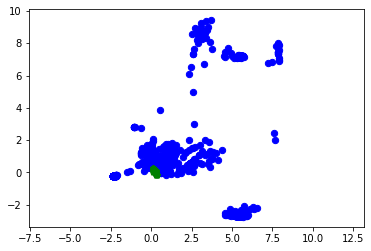

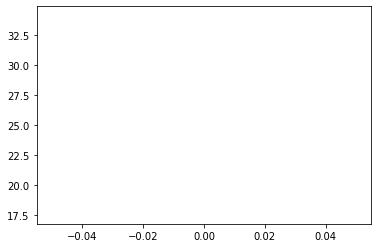

epoch:  10


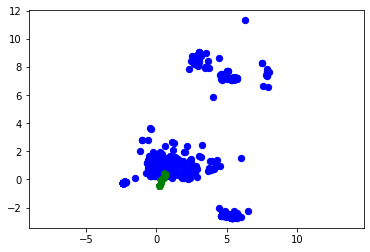

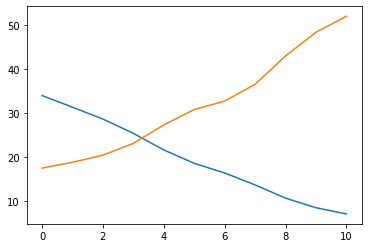

Shapes: 
(92671, 20) (92671,)
Paichi weakpoint: 2
epoch:  0


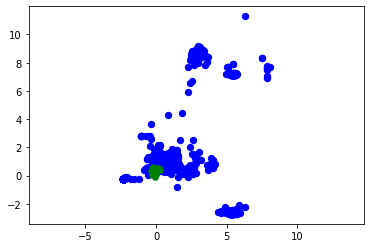

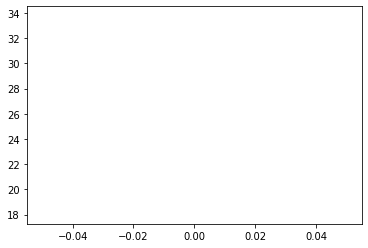

epoch:  10


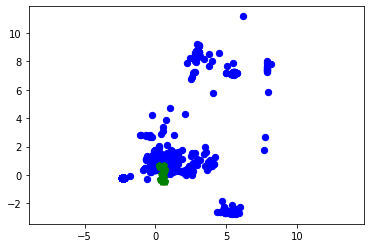

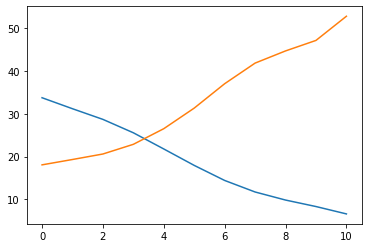

Shapes: 
(92721, 20) (92721,)
Paichi weakpoint: 3
epoch:  0


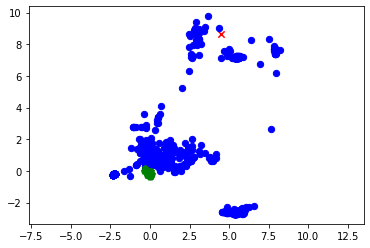

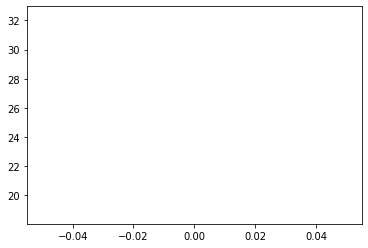

epoch:  10


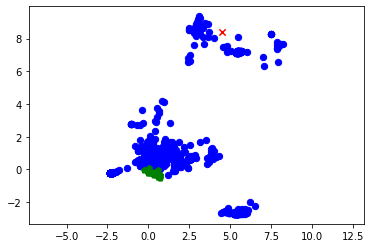

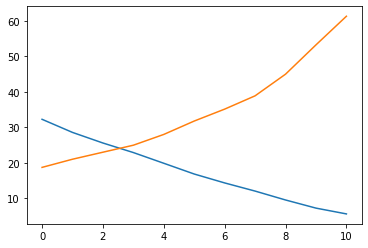

Shapes: 
(92771, 20) (92771,)
Paichi weakpoint: 5
epoch:  0


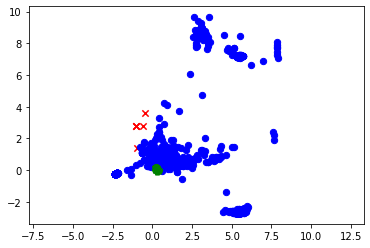

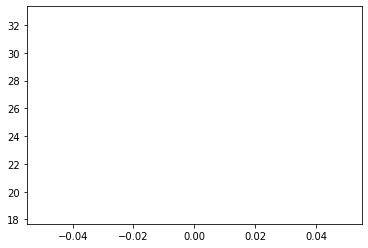

epoch:  10


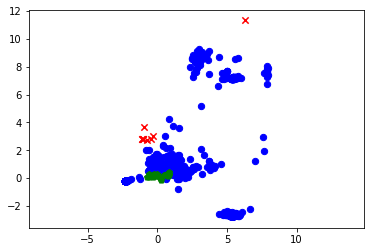

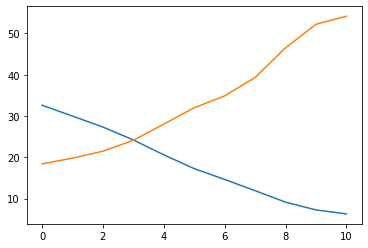

Shapes: 
(92821, 20) (92821,)
Paichi weakpoint: 6
epoch:  0


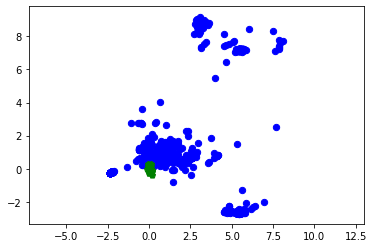

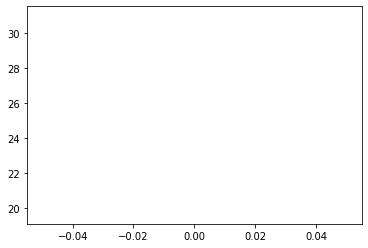

epoch:  10


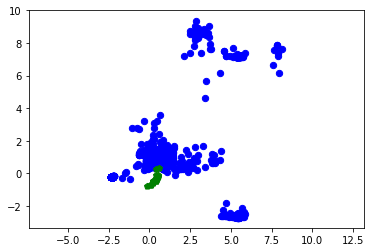

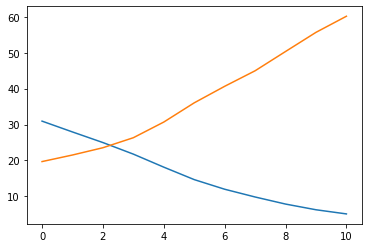

Shapes: 
(92871, 20) (92871,)
Paichi weakpoint: 10
epoch:  0


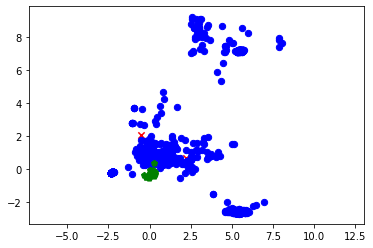

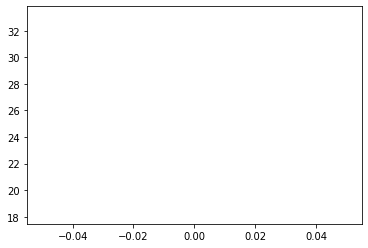

epoch:  10


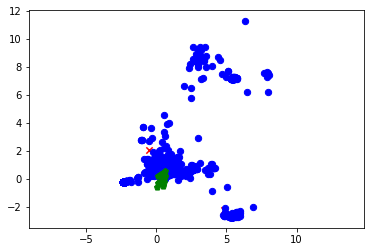

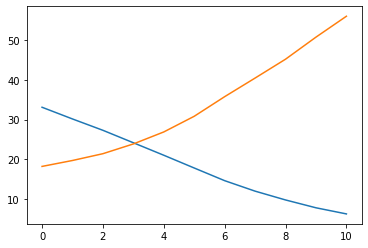

Shapes: 
(92921, 20) (92921,)
Paichi weakpoint: 21
epoch:  0


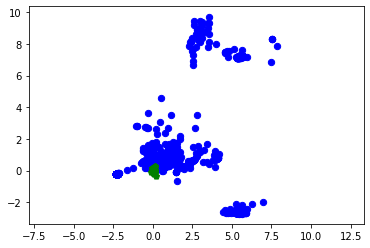

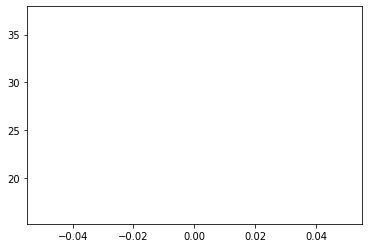

epoch:  10


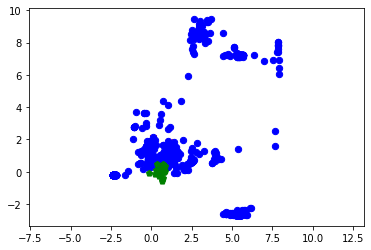

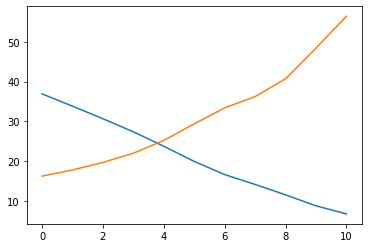

Shapes: 
(92971, 20) (92971,)


In [14]:
########################   Finding Weak labels ##############################

classification_mat=np.array(classification_list).astype(np.float)
numOfSamples=50

for each_class in classification_mat:
    if each_class[-2]<0.95:
        weakpoint=int(each_class[0])
       


    #####################********** GAN Parameters  **************##############
            
        x_g=np.copy(x_partial)
        y_g=np.zeros(y_partial.shape)
        y_g[y_partial==weakpoint]=1

        data = [(x, y) for x, y in zip(x_g,y_g)]
        dataSet=Data_Loader(data)
        data_loader = DataLoader(dataset=dataSet, batch_size=5000, shuffle=True)
        discriminator = DiscriminatorNet()
        generator = GeneratorNet()

        ###########################################################
        d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
        g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

        loss = nn.BCELoss()
        ###########################################################
        num_test_samples = 20
        test_noise = noise(num_test_samples)

        #*********************************************  Running GAN   ***************************
        #%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
        
        num_epochs = 20
        d_errs=[]
        g_errs=[]

        print(data_loader)
        for epoch in range(num_epochs):
            g_error_sum=0
            d_error_sum=0
            for n_batch, (real_batch,y_real) in enumerate(data_loader):
                N = real_batch.size(0)

                # 1. Train Discriminator
                real_data = Variable(real_batch)
                #real_target=Variable(real_target)
                # Generate fake data and detach 

                #print(real_data.shape)

                # (so gradients are not calculated for generator)
                fake_data = generator(noise(N)).detach()

                # Train D
                y_real=np.array(y_real)
                d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data,y_real)

                # 2. Train Generator

                # Generate fake data
                fake_data = generator(noise(N))
                # Train G
                g_error = train_generator(g_optimizer, fake_data)

                g_error_sum+=g_error

                d_error_sum+=d_error


            d_errs.append(d_error_sum)
            g_errs.append(g_error_sum)  

            if (epoch) % 10 == 0:
                print("epoch: ",epoch)
                test_noise = noise(num_test_samples)
                test_images =(generator(test_noise))
                test_images = test_images.data
                real_data=real_data.data


                plt.plot()
                plt.scatter(real_data[:,0][y_real==1], real_data[:,1][y_real==1], s=40, marker='x',c='red')
                plt.scatter(real_data[:,0][y_real==0], real_data[:,1][y_real==0], s=40, marker='o',c='blue')
                plt.scatter(test_images[:,0], test_images[:,1], s=40, marker='p',c='green')
                plt.axis('equal')
                plt.show()

                plt.plot()
                plt.plot(d_errs)
                plt.plot(g_errs)
                plt.show()

        ############  Generating and adding new samples  ###########
        x_syn=(generator(noise(numOfSamples))).detach().numpy() 
        y_syn=np.ones(numOfSamples)*weakpoint
        #************************************************
        x_train=np.concatenate((x_train,x_syn),axis=0)
        y_train=np.concatenate((y_train,y_syn),axis=0)
        print("Shapes: ")
        print(x_train.shape,y_train.shape)

# Running IDS again on GAN generated data 

In [15]:
####################  DATA LOADING   #####################

x_train = torch.from_numpy(x_train).type(torch.FloatTensor)
x_test = torch.from_numpy(x_test).type(torch.FloatTensor)

y_train = torch.from_numpy(y_train).type(torch.LongTensor)
y_test = torch.from_numpy(y_test).type(torch.LongTensor)

Training_data = [(x, y) for x, y in zip(x_train,y_train)]
Testing_data = [(x, y) for x, y in zip(x_test,y_test)]
        
#######################  Train and Test Data Set  ##########################

Training_DataSet=Data_Loader(Training_data)
Testing_DataSet=Data_Loader(Testing_data)

train_loader = DataLoader(dataset=Training_DataSet, batch_size=500, shuffle=True)
testing_loader = DataLoader(dataset=Testing_DataSet, batch_size=len(Testing_DataSet), shuffle=True)

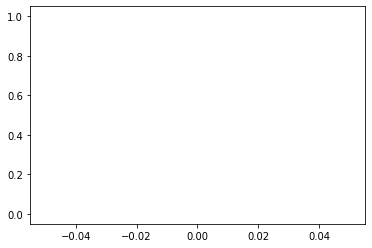

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.87', '0.91', '0.89', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.95', '1.00', '0.97', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.00', '0.00', '0.00', '65']
['', '17', '0.88', '0.70', '0.78', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.78', '1.00', '0.87', '62']
['', '21', '0.00', '0.00', '0.00', '64']


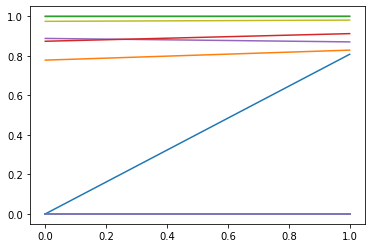

['', '0', '0.00', '0.00', '0.00', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.00', '0.00', '0.00', '4']
['', '5', '0.78', '0.99', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.97', '0.99', '0.98', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '1.00', '0.68', '0.81', '65']
['', '17', '0.84', '0.82', '0.83', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.84', '1.00', '0.91', '62']
['', '21', '0.00', '0.00', '0.00', '64']


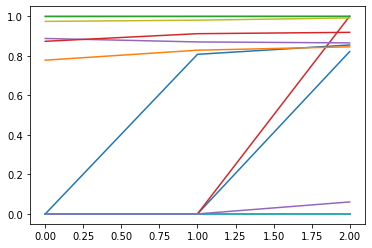

['', '0', '0.72', '0.95', '0.82', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '1.00', '1.00', '1.00', '4']
['', '5', '0.77', '0.99', '0.87', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.96', '0.77', '0.85', '65']
['', '17', '0.87', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.85', '1.00', '0.92', '62']
['', '21', '1.00', '0.03', '0.06', '64']


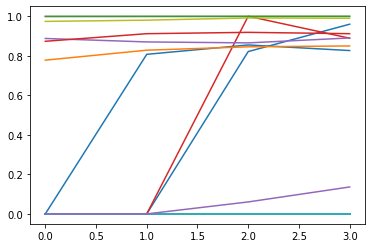

['', '0', '0.97', '0.95', '0.96', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.81', '0.99', '0.89', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '0.00', '0.00', '0.00', '17']
['', '15', '0.89', '0.77', '0.83', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.84', '1.00', '0.91', '62']
['', '21', '0.25', '0.09', '0.14', '64']


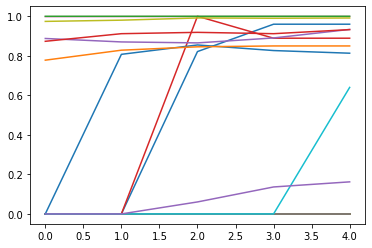

['', '0', '0.97', '0.95', '0.96', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.89', '0.99', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.47', '0.64', '17']
['', '15', '0.86', '0.77', '0.81', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.60', '0.09', '0.16', '64']


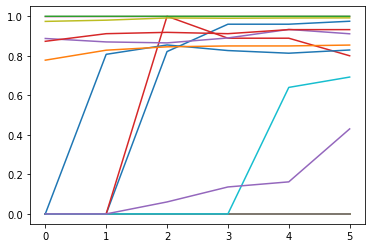

['', '0', '0.97', '0.98', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.67', '1.00', '0.80', '4']
['', '5', '0.85', '0.99', '0.91', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '1.00', '0.53', '0.69', '17']
['', '15', '0.88', '0.78', '0.83', '65']
['', '17', '0.89', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.87', '1.00', '0.93', '62']
['', '21', '0.69', '0.31', '0.43', '64']


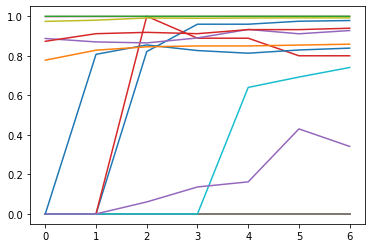

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.67', '1.00', '0.80', '4']
['', '5', '0.88', '0.99', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.00', '0.00', '0.00', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.59', '0.74', '17']
['', '15', '0.88', '0.80', '0.84', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.89', '1.00', '0.94', '62']
['', '21', '0.78', '0.22', '0.34', '64']


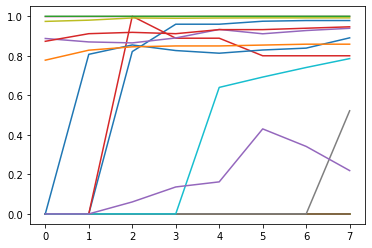

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '0.00', '0.00', '0.00', '2']
['', '3', '0.67', '1.00', '0.80', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.75', '0.40', '0.52', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.90', '0.82', '0.86', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.90', '1.00', '0.95', '62']
['', '21', '0.89', '0.12', '0.22', '64']


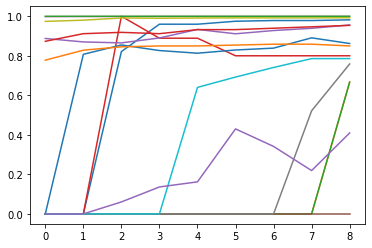

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.67', '1.00', '0.80', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.98', '0.77', '0.86', '65']
['', '17', '0.88', '0.82', '0.85', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.89', '0.27', '0.41', '64']


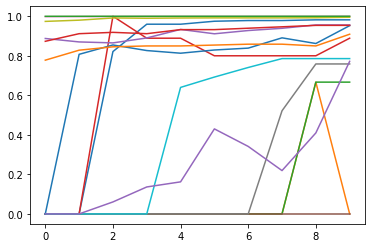

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.65', '0.79', '17']
['', '15', '0.98', '0.92', '0.95', '65']
['', '17', '0.98', '0.85', '0.91', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.91', '1.00', '0.95', '62']
['', '21', '0.88', '0.69', '0.77', '64']


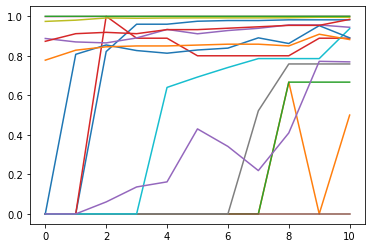

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.50', '0.50', '0.50', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '0.99', '0.99', '6080']
['', '14', '1.00', '0.88', '0.94', '17']
['', '15', '0.98', '0.82', '0.89', '65']
['', '17', '0.91', '0.86', '0.88', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.97', '1.00', '0.98', '62']
['', '21', '0.76', '0.78', '0.77', '64']


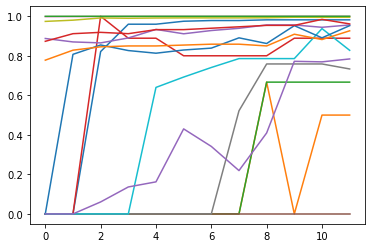

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.50', '0.50', '0.50', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '0.99', '6080']
['', '14', '1.00', '0.71', '0.83', '17']
['', '15', '0.98', '0.92', '0.95', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.93', '1.00', '0.96', '62']
['', '21', '0.80', '0.77', '0.78', '64']


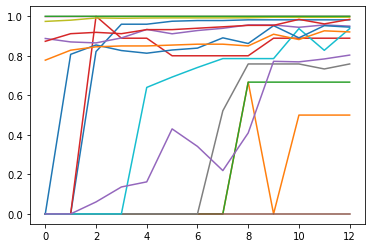

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.50', '0.50', '0.50', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.88', '0.94', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.87', '0.92', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.97', '1.00', '0.98', '62']
['', '21', '0.89', '0.73', '0.80', '64']


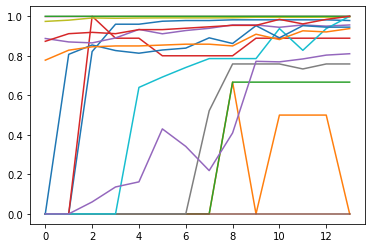

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.90', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.73', '0.81', '64']


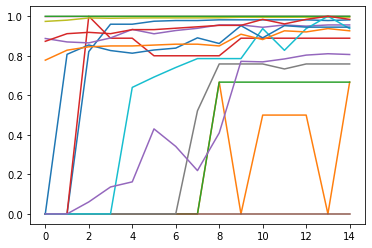

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '0.88', '0.94', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '0.97', '1.00', '0.98', '62']
['', '21', '0.83', '0.78', '0.81', '64']


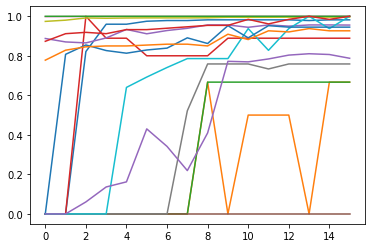

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.96', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.88', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.79', '0.78', '0.79', '64']


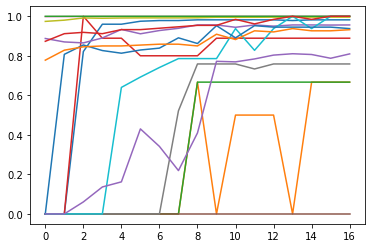

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.89', '0.93', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.82', '0.80', '0.81', '64']


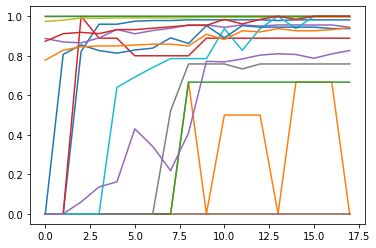

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.78', '0.83', '64']


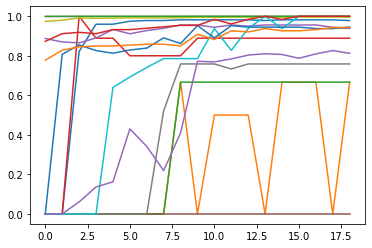

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.91', '0.94', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.81', '0.81', '0.81', '64']


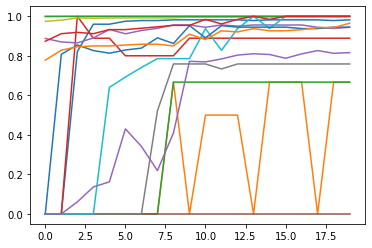

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.95', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.84', '0.80', '0.82', '64']


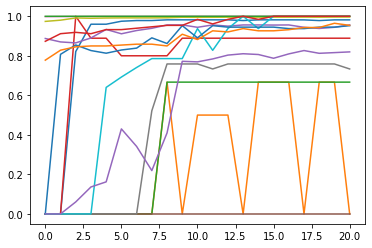

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.92', '0.95', '65']
['', '17', '0.98', '0.93', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.86', '0.78', '0.82', '64']


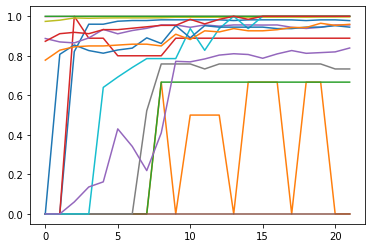

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.92', '0.94', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.73', '0.84', '64']


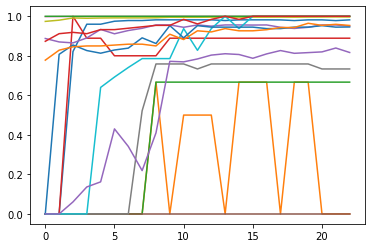

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.95', '0.94', '0.95', '65']
['', '17', '0.99', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.77', '0.82', '64']


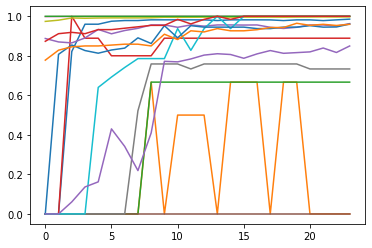

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.94', '0.96', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.75', '0.85', '64']


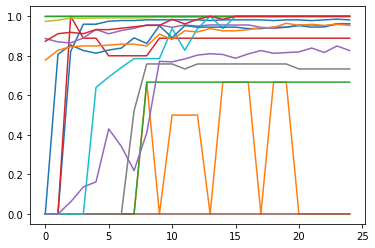

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '0.99', '0.92', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.78', '0.83', '64']


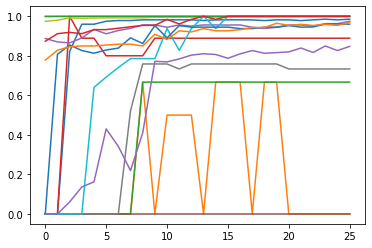

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.92', '0.96', '65']
['', '17', '0.98', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.78', '0.85', '64']


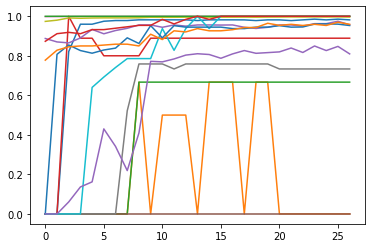

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.94', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.82', '0.80', '0.81', '64']


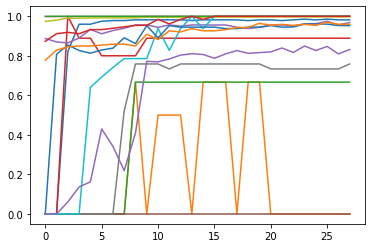

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.92', '0.95', '65']
['', '17', '0.98', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.73', '0.83', '64']


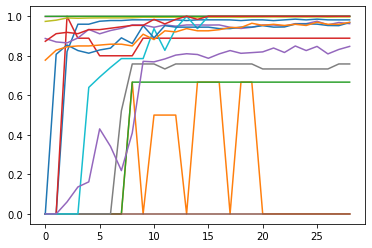

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.99', '0.95', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.78', '0.85', '64']


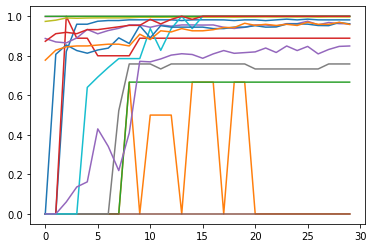

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '1.00', '0.92', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.75', '0.85', '64']


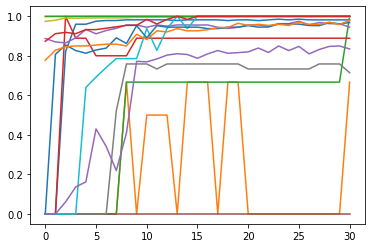

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.77', '0.67', '0.71', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.84', '0.83', '0.83', '64']


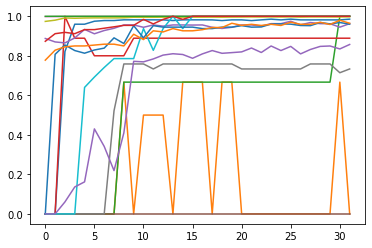

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.92', '0.96', '65']
['', '17', '0.98', '0.95', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.80', '0.86', '64']


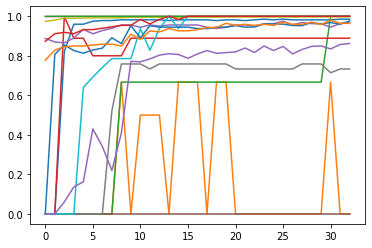

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '1.00', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.78', '0.86', '64']


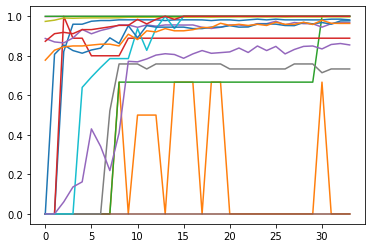

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.83', '0.85', '64']


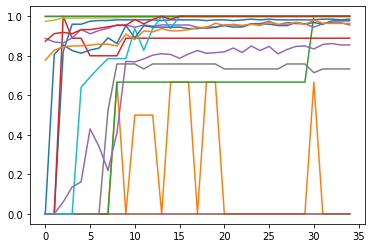

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.93', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.78', '0.85', '64']


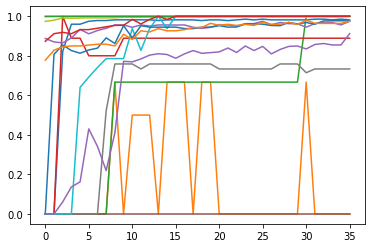

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.89', '0.91', '64']


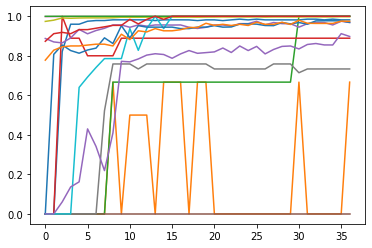

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '1.00', '0.95', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.90', '0.89', '0.90', '64']


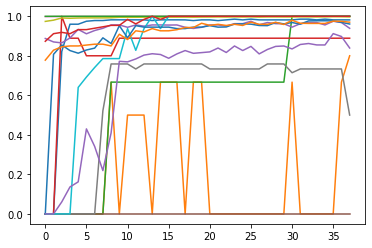

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.67', '1.00', '0.80', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.67', '0.40', '0.50', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.94', '0.96', '65']
['', '17', '0.97', '0.97', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.73', '0.84', '64']


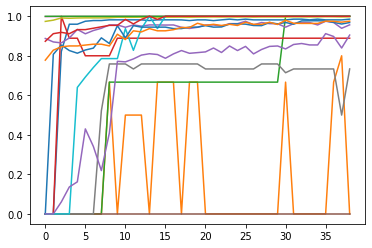

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.97', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.89', '0.90', '64']


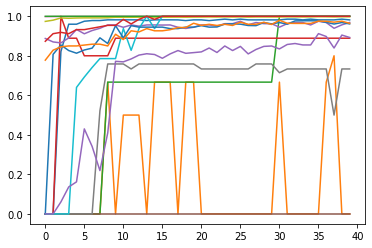

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '0.99', '0.94', '0.96', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.84', '0.89', '64']


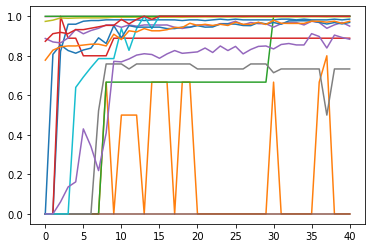

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.95', '0.97', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.89', '0.88', '64']


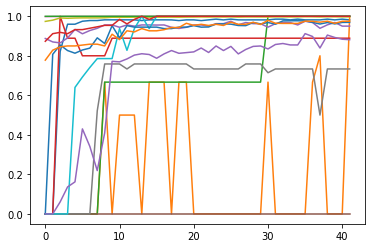

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '1.00', '1.00', '1.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.81', '0.88', '64']


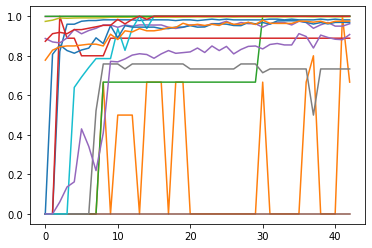

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.97', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.84', '0.91', '64']


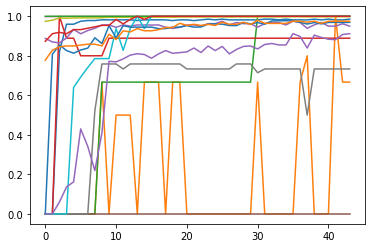

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.89', '0.91', '64']


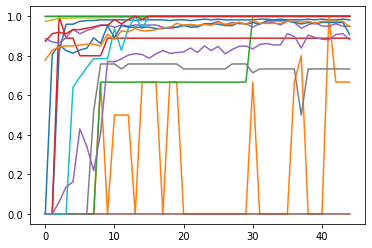

['', '0', '1.00', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.73', '0.73', '0.73', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.83', '0.91', '65']
['', '17', '0.92', '0.98', '0.95', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.81', '0.88', '64']


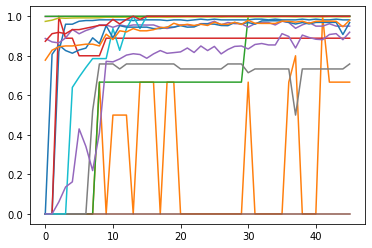

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.98', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


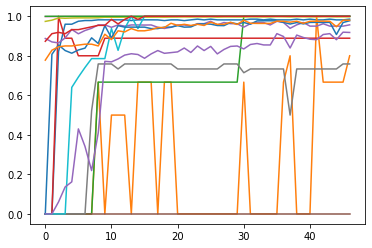

['', '0', '1.00', '0.97', '0.99', '138']
['', '1', '0.67', '1.00', '0.80', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.88', '0.92', '64']


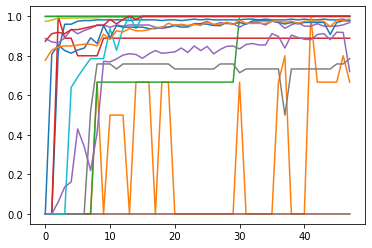

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '1.00', '0.56', '0.72', '64']


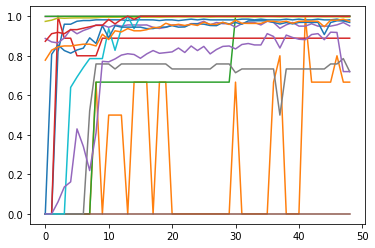

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '1.00', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '0.99', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.95', '0.97', '65']
['', '17', '0.98', '0.97', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '1.00', '0.56', '0.72', '64']


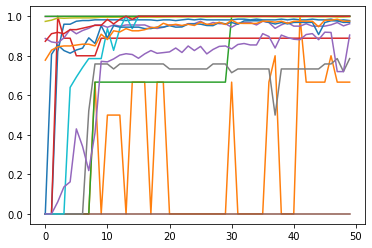

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.96', '0.98', '0.97', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.89', '0.90', '64']


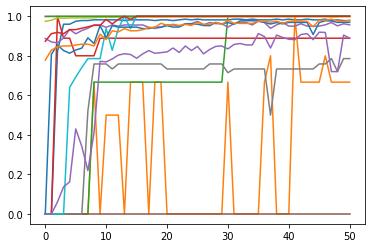

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '1.00', '0.96', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.81', '0.89', '64']


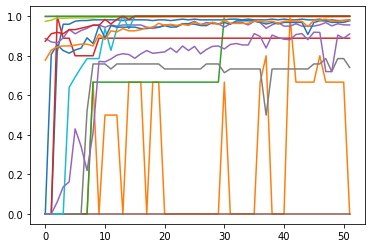

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.83', '0.67', '0.74', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.96', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.88', '0.91', '64']


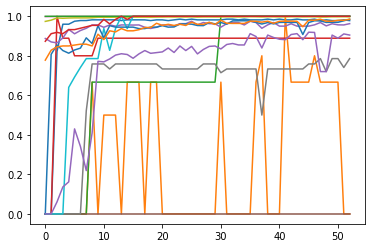

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.89', '0.90', '64']


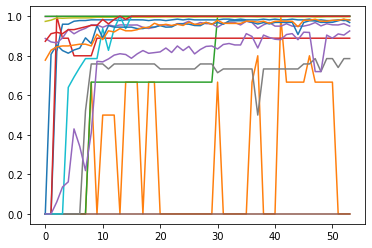

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.94', '0.97', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.88', '0.93', '64']


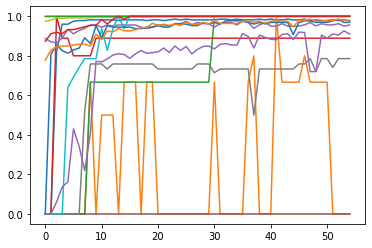

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.96', '0.98', '0.97', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.88', '0.91', '64']


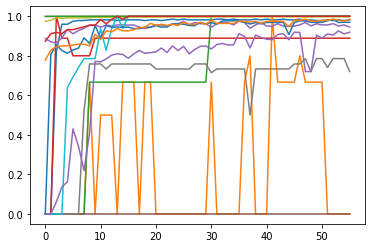

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '1.00', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


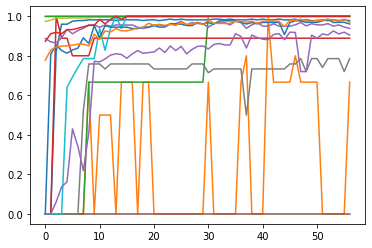

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.90', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.94', '0.96', '65']
['', '17', '0.98', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.89', '0.90', '64']


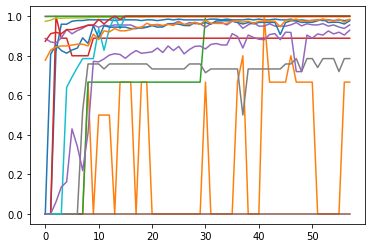

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


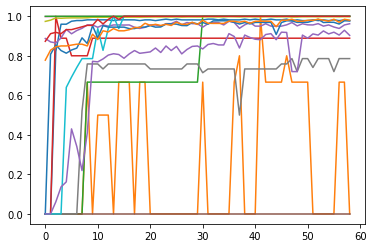

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.88', '0.90', '64']


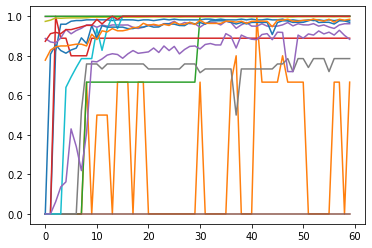

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.97', '0.97', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.83', '0.88', '64']


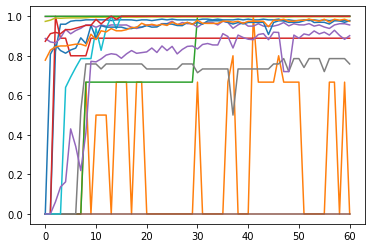

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.96', '1.00', '0.98', '65']
['', '17', '0.99', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.86', '0.90', '64']


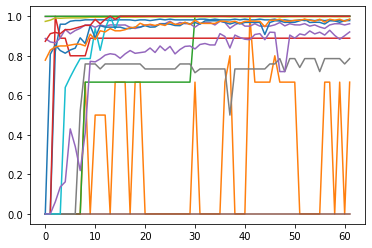

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


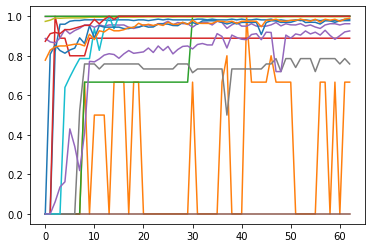

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.88', '0.93', '64']


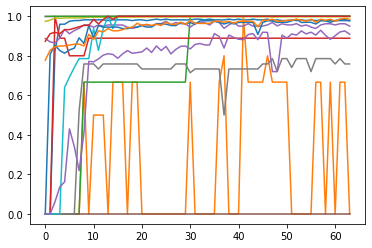

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.96', '0.86', '0.91', '64']


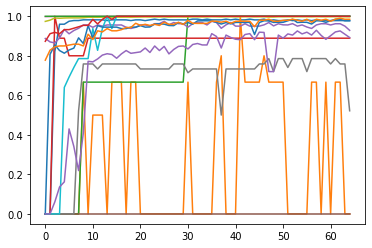

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.87', '1.00', '0.93', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.75', '0.40', '0.52', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.88', '0.91', '0.89', '64']


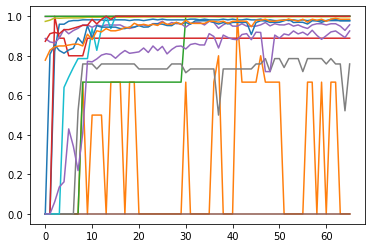

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.88', '0.93', '64']


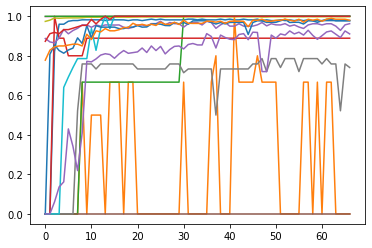

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.83', '0.67', '0.74', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.88', '0.91', '64']


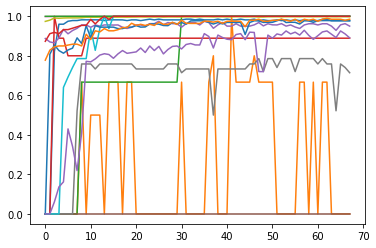

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.77', '0.67', '0.71', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.89', '0.89', '64']


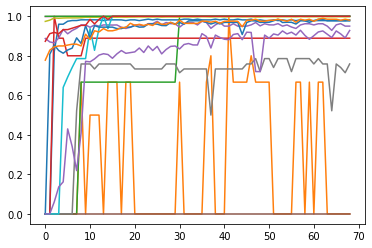

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


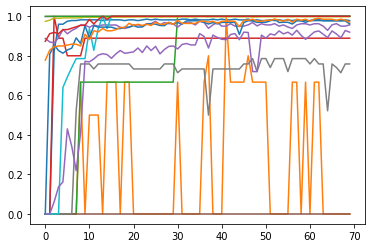

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.95', '0.96', '65']
['', '17', '0.98', '0.96', '0.97', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


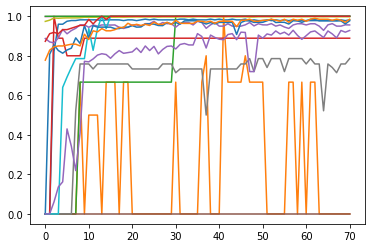

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


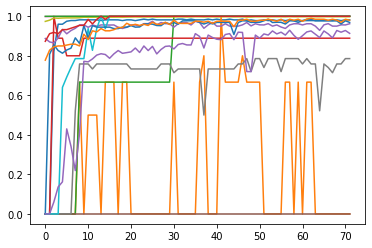

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.95', '0.97', '65']
['', '17', '0.98', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.91', '0.91', '64']


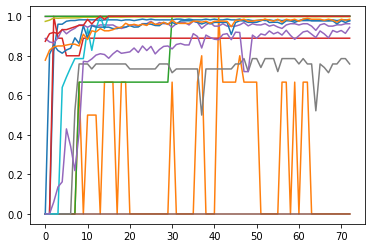

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


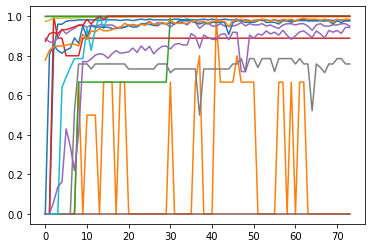

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


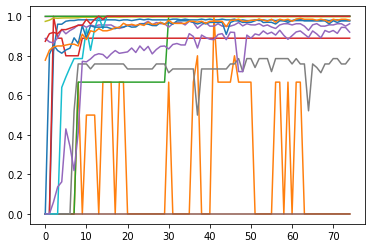

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


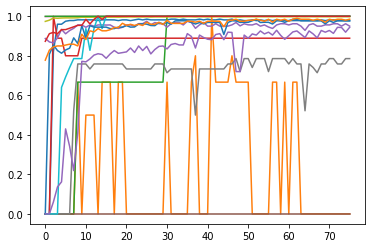

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


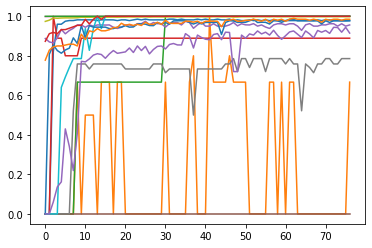

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


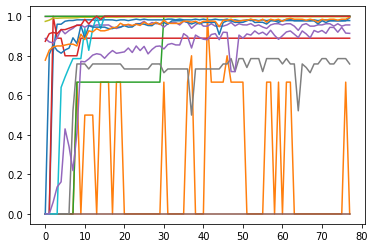

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.91', '0.91', '64']


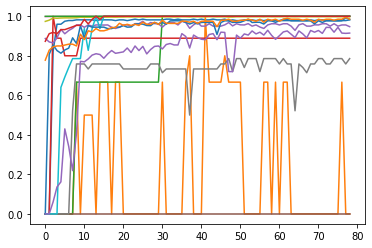

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.97', '0.92', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


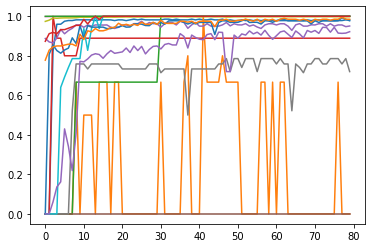

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.99', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.90', '0.60', '0.72', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


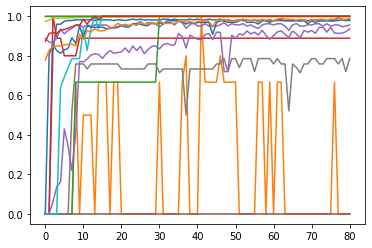

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


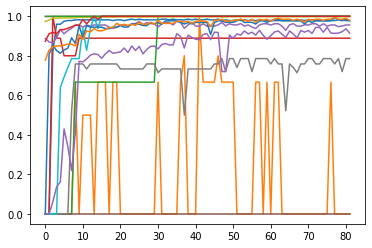

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


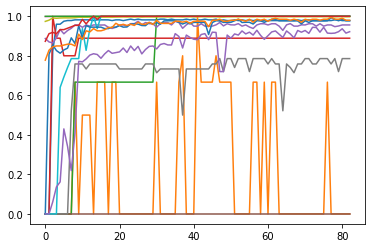

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.96', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


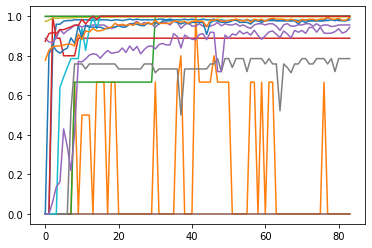

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


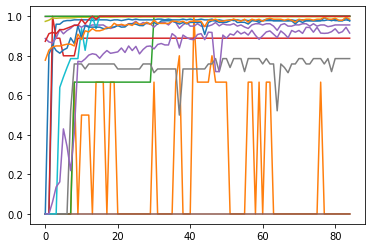

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


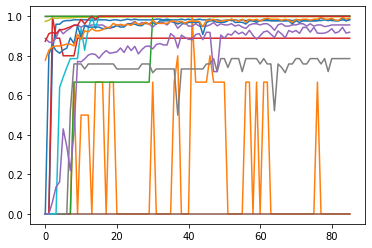

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


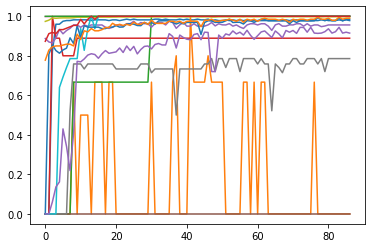

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


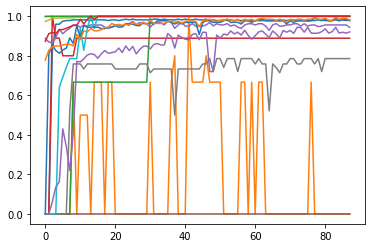

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


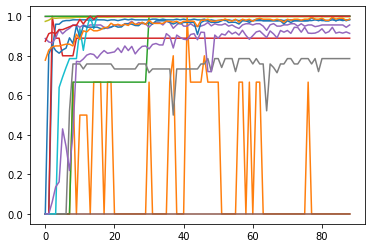

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.91', '0.91', '64']


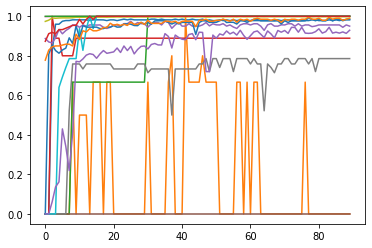

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


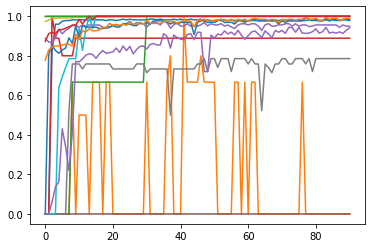

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '1.00', '0.89', '0.94', '64']


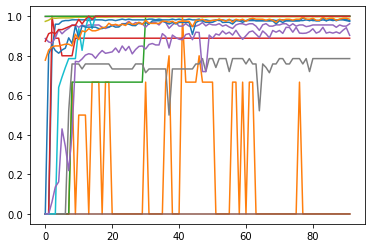

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.93', '0.88', '0.90', '64']


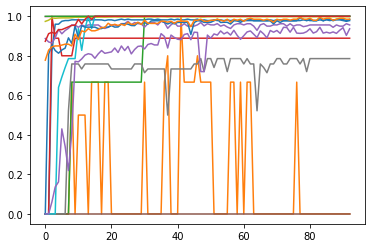

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


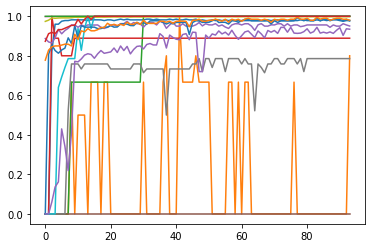

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.67', '1.00', '0.80', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.99', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.89', '0.93', '64']


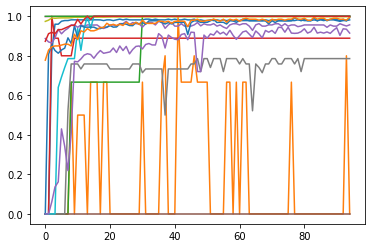

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


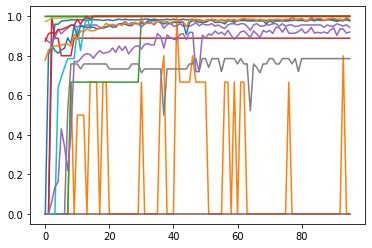

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.92', '0.97', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


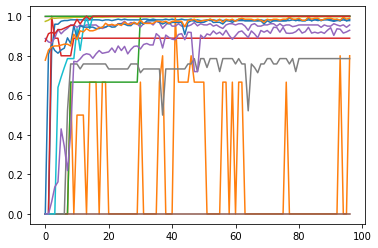

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.67', '1.00', '0.80', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


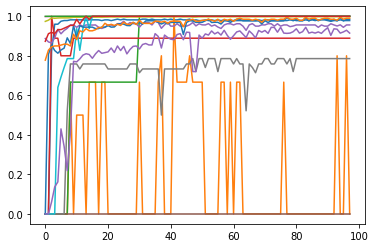

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


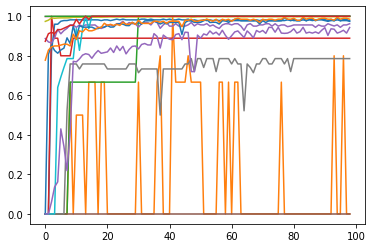

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


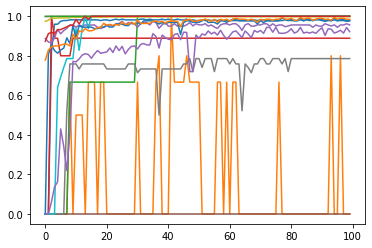

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


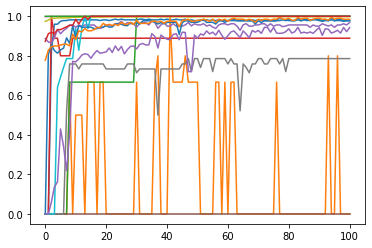

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


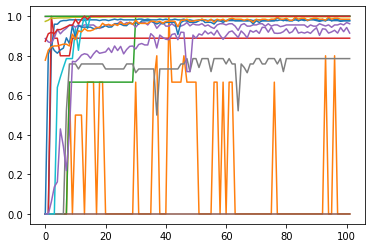

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


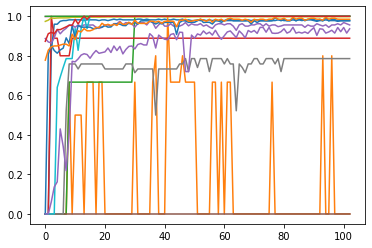

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


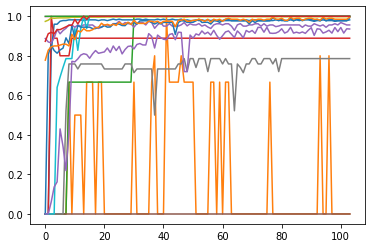

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


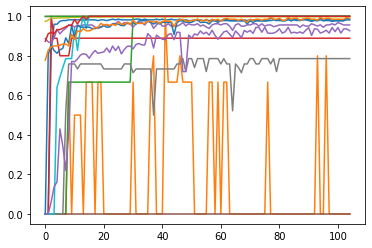

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.89', '0.93', '64']


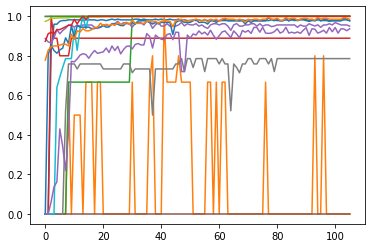

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.97', '0.95', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


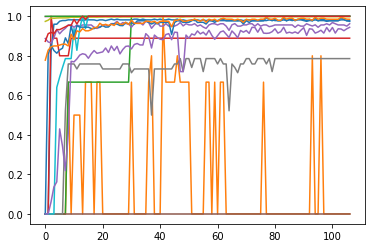

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


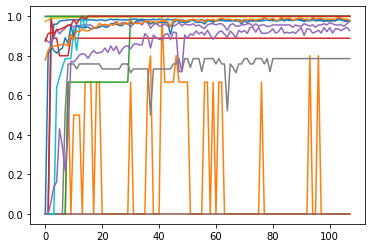

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.97', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


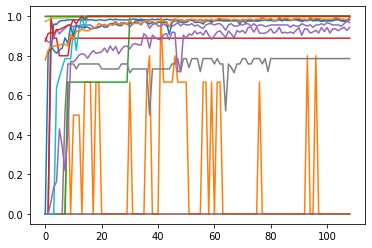

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


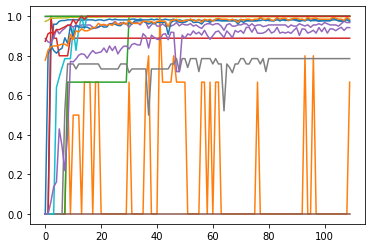

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '1.00', '0.89', '0.94', '64']


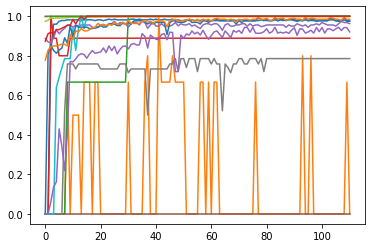

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


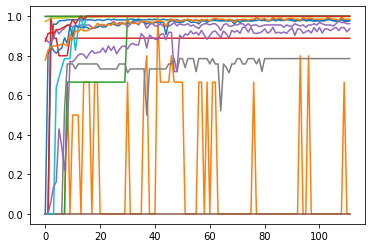

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


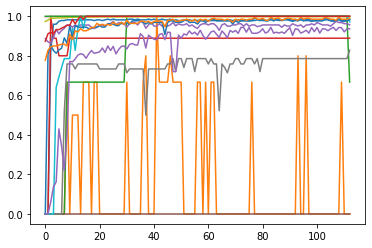

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


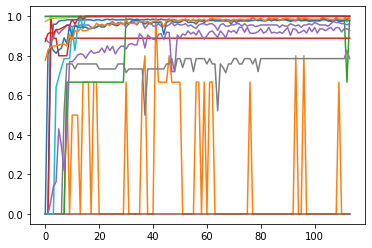

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


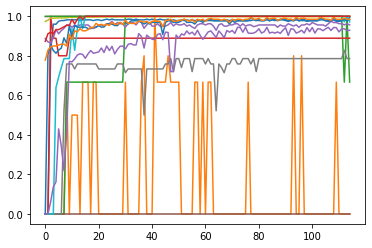

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


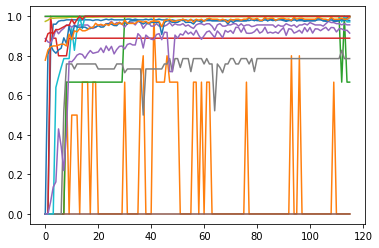

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


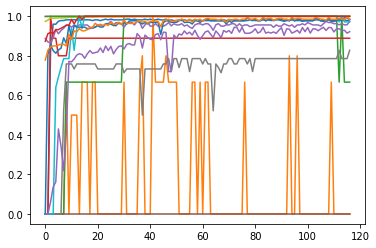

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.97', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


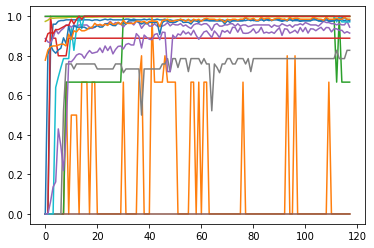

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


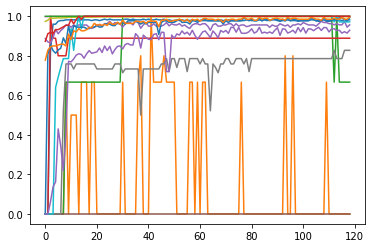

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


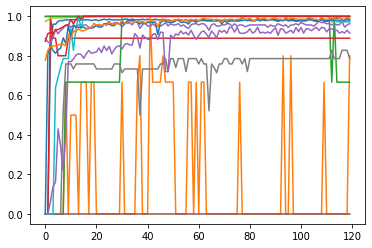

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.67', '1.00', '0.80', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


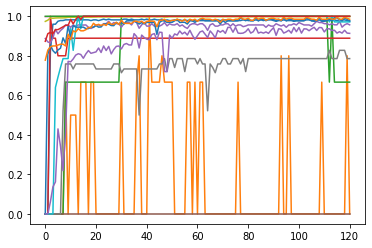

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.91', '0.91', '64']


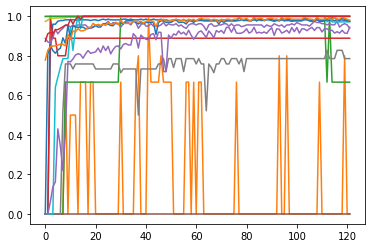

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.99', '0.90', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


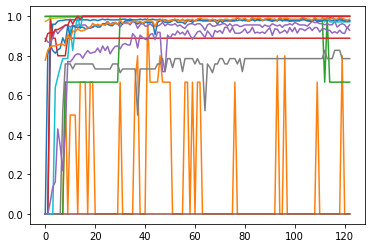

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


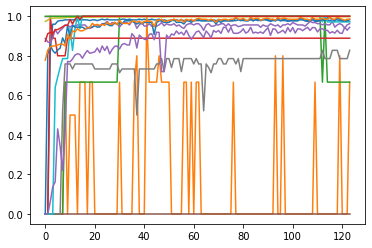

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '1.00', '0.50', '0.67', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


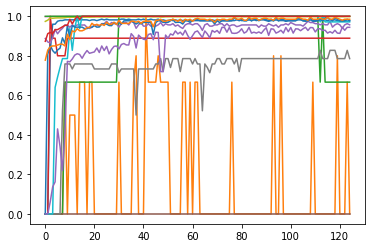

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


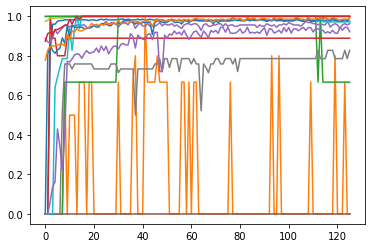

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


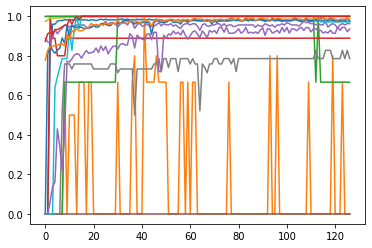

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


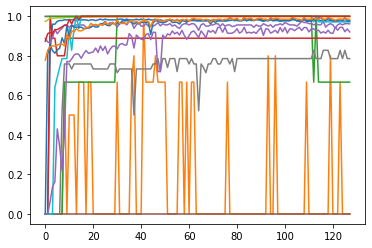

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.96', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


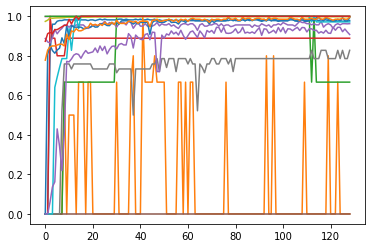

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.89', '0.92', '0.91', '64']


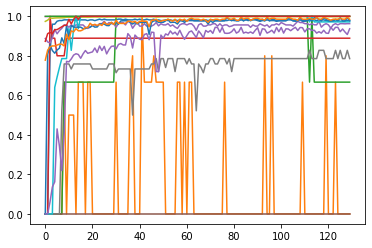

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


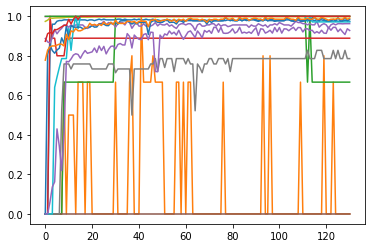

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


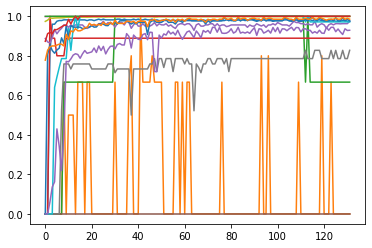

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '0.50', '0.67', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.97', '0.97', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '0.94', '1.00', '0.97', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


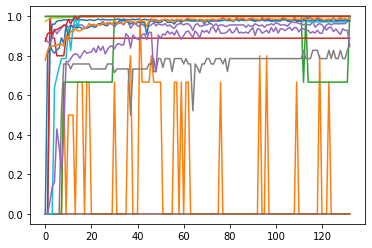

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.97', '0.99', '0.98', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.92', '0.80', '0.86', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '1.00', '0.73', '0.85', '64']


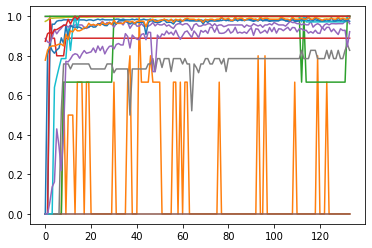

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


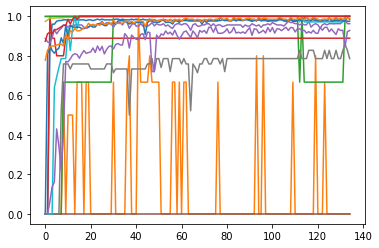

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


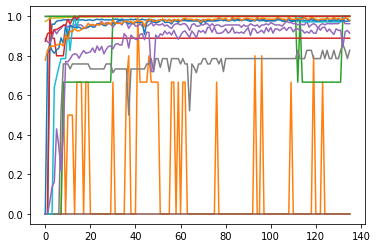

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


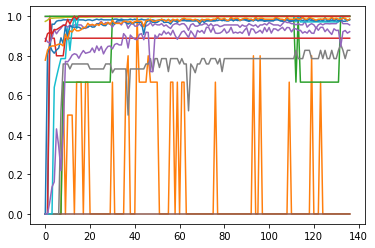

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


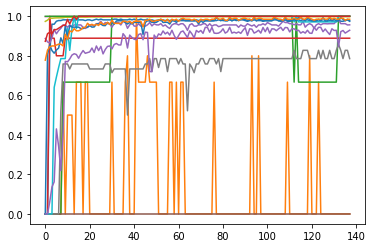

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


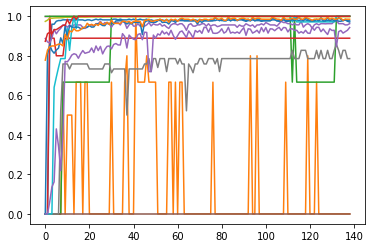

['', '0', '0.98', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


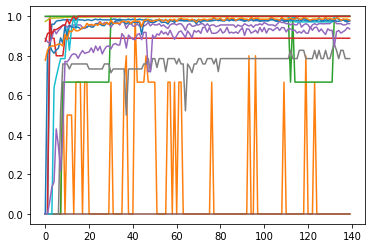

['', '0', '0.98', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.97', '0.99', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


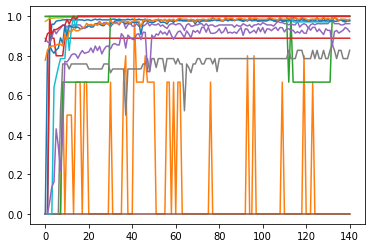

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


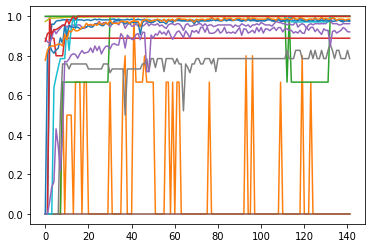

['', '0', '0.98', '0.97', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


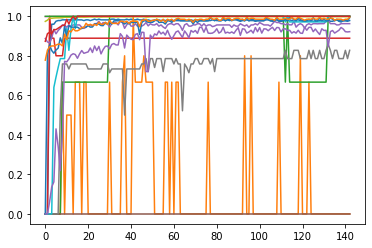

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


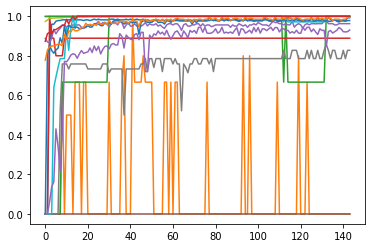

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.94', '0.93', '64']


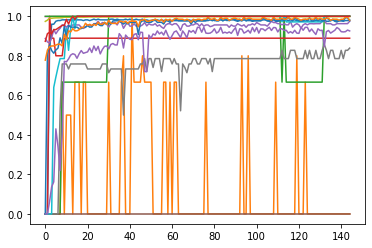

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.96', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '0.99', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.88', '0.93', '64']


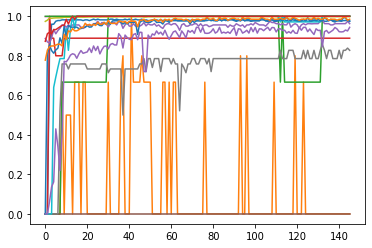

['', '0', '0.99', '0.96', '0.97', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


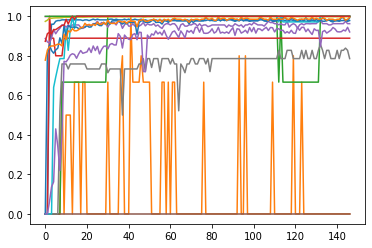

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


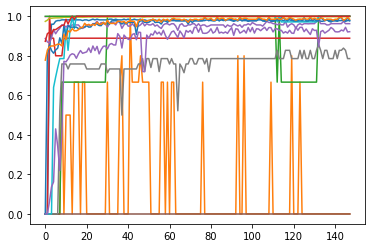

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


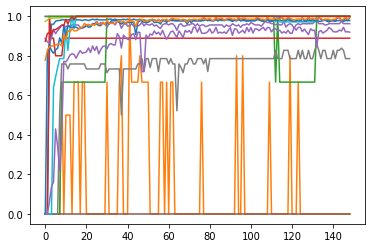

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.89', '0.92', '64']


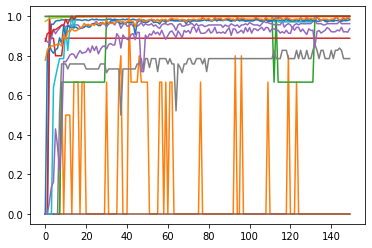

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


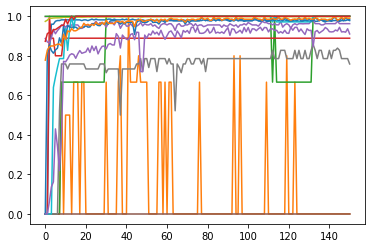

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.88', '0.91', '64']


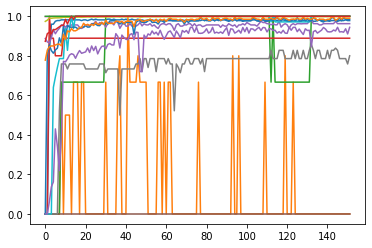

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.92', '0.94', '64']


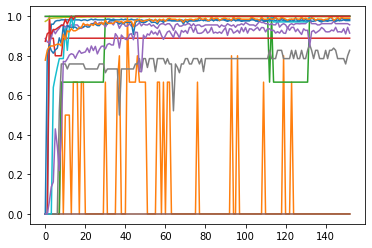

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


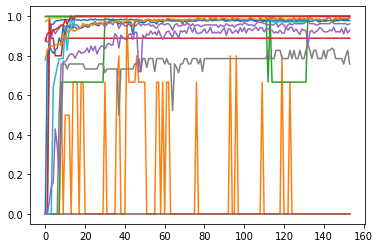

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


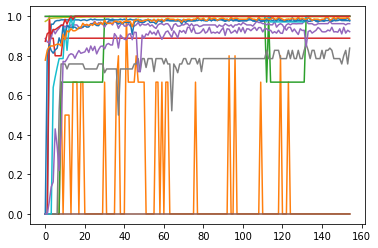

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


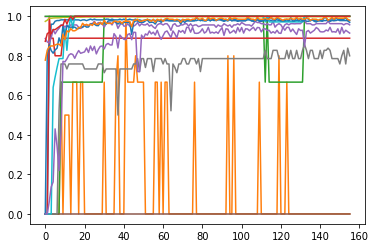

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.95', '0.97', '65']
['', '17', '0.98', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


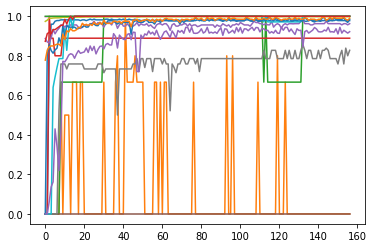

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


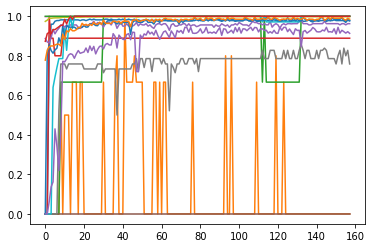

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.97', '0.98', '65']
['', '17', '0.99', '0.98', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.91', '0.91', '64']


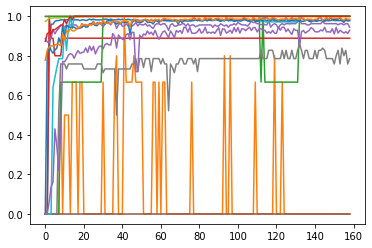

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.91', '0.99', '0.94', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


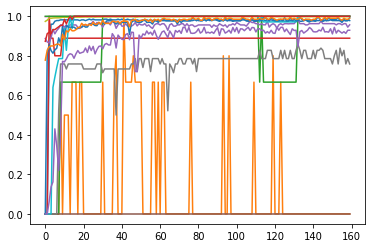

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


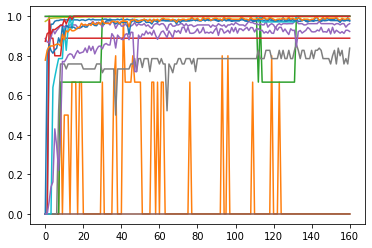

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.94', '0.92', '64']


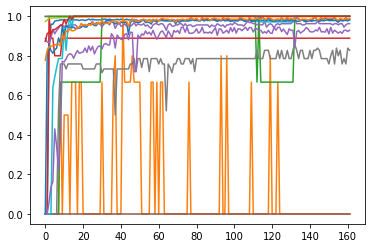

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


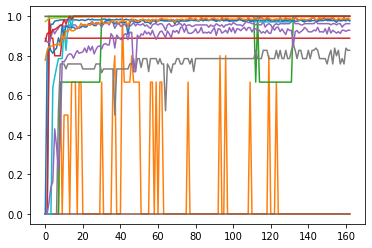

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


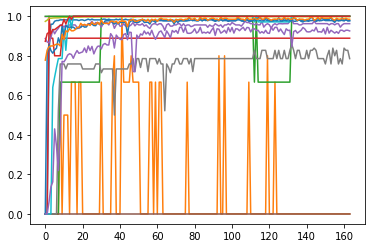

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.88', '0.93', '64']


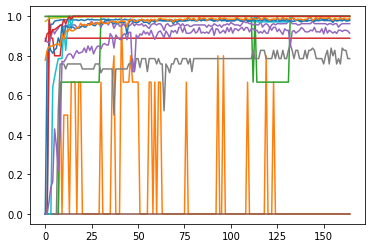

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


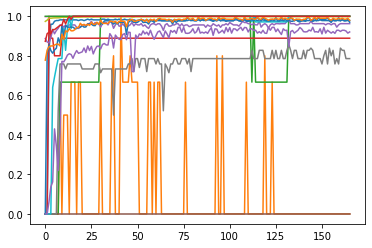

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.96', '0.98', '0.97', '65']
['', '17', '1.00', '0.96', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


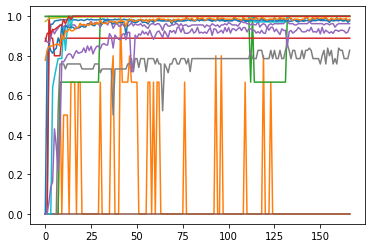

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


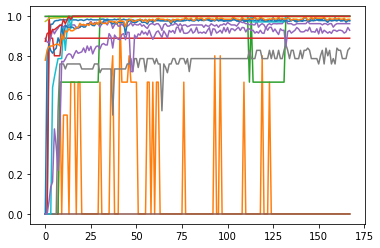

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


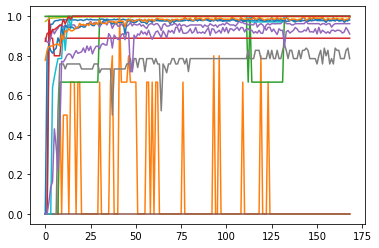

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.88', '0.91', '64']


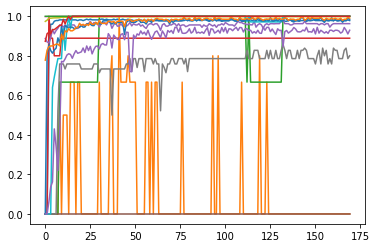

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


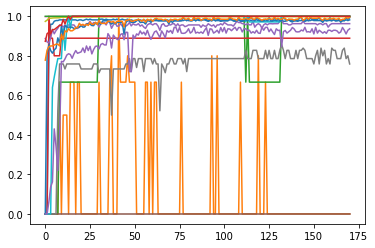

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


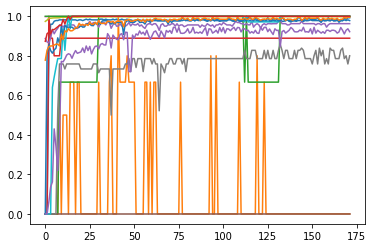

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


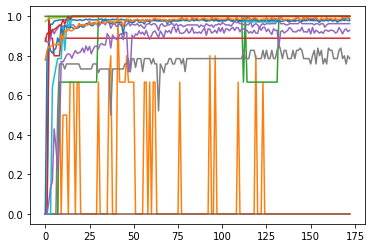

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


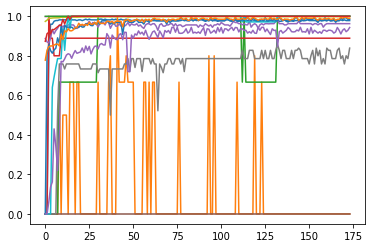

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.91', '0.94', '64']


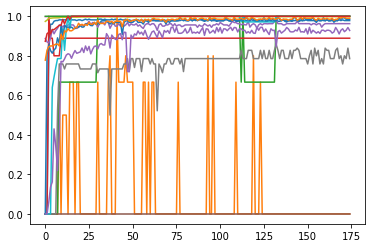

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


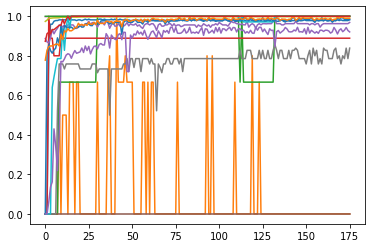

['', '0', '0.99', '0.98', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


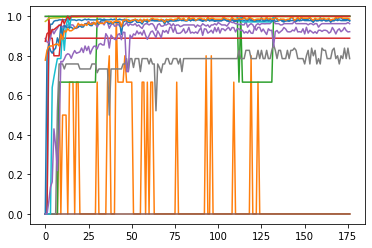

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


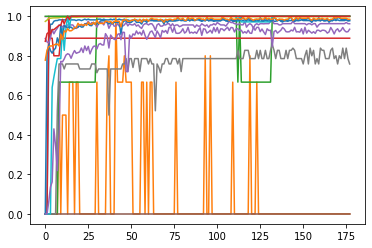

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.97', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.89', '0.93', '64']


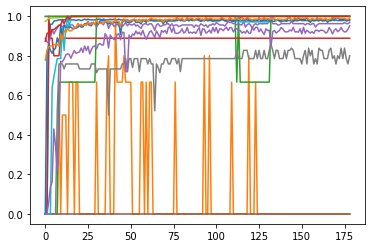

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.98', '0.98', '0.98', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.92', '0.95', '64']


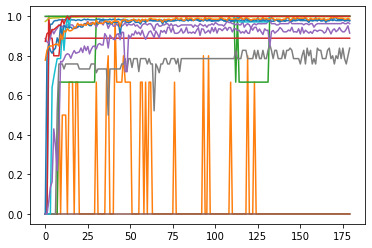

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.91', '0.92', '0.91', '64']


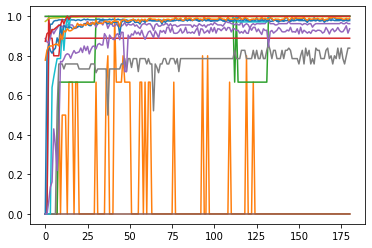

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


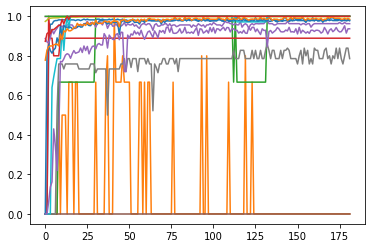

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


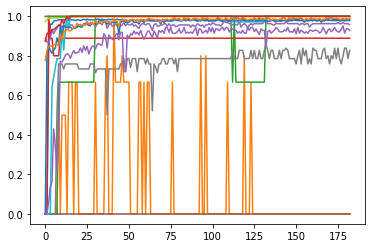

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


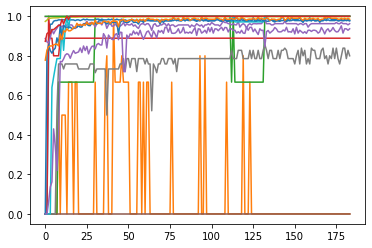

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


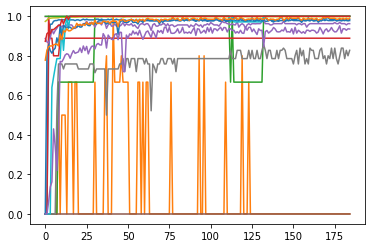

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


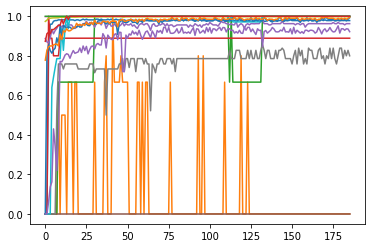

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


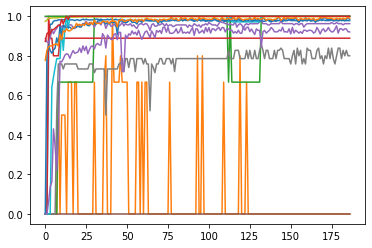

['', '0', '0.99', '0.96', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


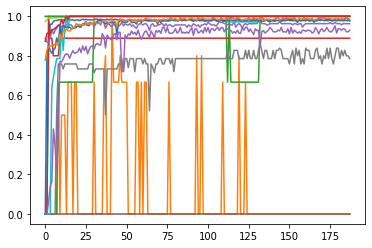

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


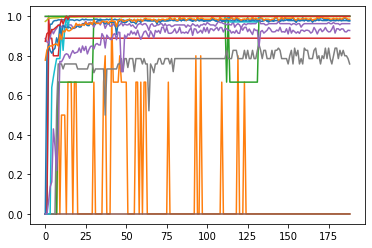

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.79', '0.73', '0.76', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.95', '0.98', '65']
['', '17', '0.98', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


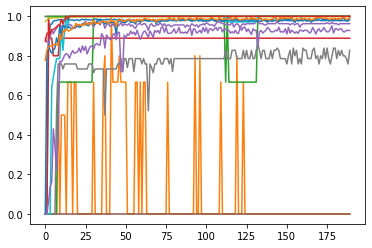

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


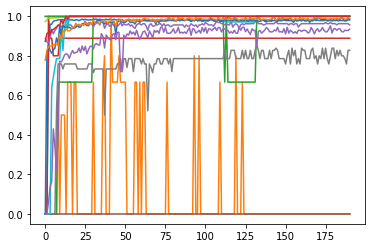

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.93', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.98', '0.89', '0.93', '64']


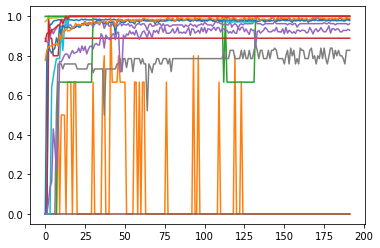

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


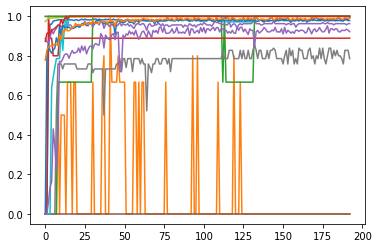

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.85', '0.73', '0.79', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.98', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.92', '0.92', '0.92', '64']


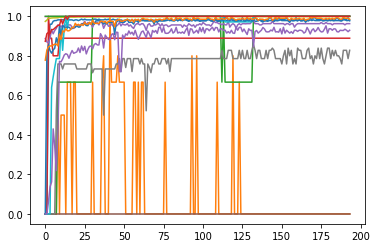

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.86', '0.80', '0.83', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


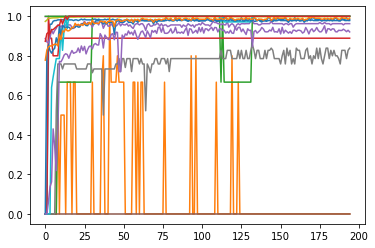

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.91', '0.92', '64']


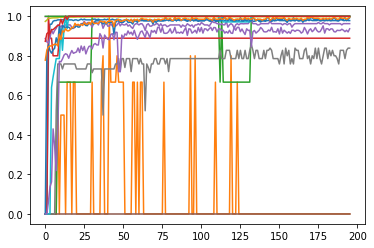

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


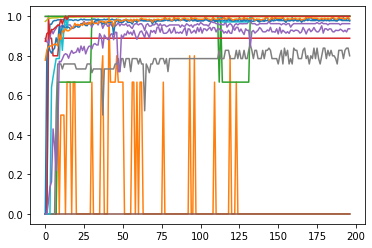

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '0.97', '0.98', '0.98', '65']
['', '17', '1.00', '0.97', '0.98', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.92', '0.94', '64']


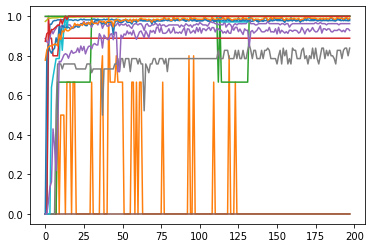

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.97', '0.98', '65']
['', '17', '0.99', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.95', '0.91', '0.93', '64']


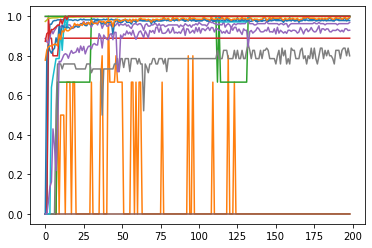

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.95', '0.99', '0.97', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.80', '0.80', '0.80', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.94', '0.92', '0.93', '64']


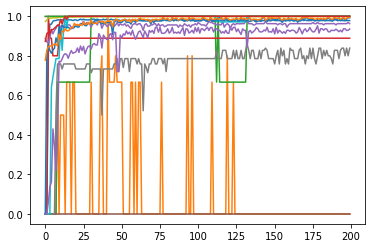

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


In [16]:
########################## Running IDS Model ######################    

model = ANN()
F1_list_after=[]
Pre_list=[]
Report_after=[]
 
#optimizer = optim.SGD(model.parameters(), lr=0.01)
optimizer = optim.Adam(model.parameters(), lr = 0.001)
criterion = nn.CrossEntropyLoss()
 
for epoch in range(maxEpochforIDS):
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    for batch_idx, (x, target) in enumerate(train_loader):
        optimizer.zero_grad()
        out = model(x)
        #print(out.data)
        loss = criterion(out, target)
        _, pred_label = torch.max(out.data, 1)
        total_cnt += x.shape[0]
        correct_cnt+= (pred_label == target).sum().item()
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
        loss.backward()
        optimizer.step()
        if(epoch+1) % 20 == 0: #or (batch_idx+1) == len(testing_loader)
            continue
            print('==>>> epoch: {}, batch index: {}, train loss: {:.6f}, acc: {:.3f}'.format(
                epoch, batch_idx+1, ave_loss, correct_cnt*1.0/total_cnt))
    # testing
    correct_cnt, ave_loss = 0, 0
    total_cnt = 0
    
    
    for batch_idx, (x, target) in enumerate(testing_loader):
        #print(batch_idx,x.shape, target.shape)
        out = model(x)
        loss = criterion(out, target)
        _, pred_label = torch.max(out.data, 1)
        total_cnt += x.shape[0]
        correct_cnt += (pred_label == target).sum().item()

        # smooth average
        ave_loss = ave_loss * 0.9 + loss.item() * 0.1
       
        if(epoch+1) % 1 == 0 or (batch_idx+1) == len(testing_loader):
            F1= f1_score(target, pred_label, average=None)
            Pre=precision_score(target, pred_label, average=None)
            
            # balancing number of labels
            if np.array(F1).size!=labels_to_consider:
                continue
            F1_list_after.append(np.array(F1))
            Pre_list.append(Pre)
            plt.plot()
            plt.plot(F1_list_after)
            plt.show()
            ##########################
            y_true =target
            y_pred = pred_label
            Report_after.append(CR_mat(y_true,y_pred))
                   
#########################################################################################


In [17]:
##################  EVALUATING PERFORMANCE of IDS ########################
y_true =target
y_pred = pred_label
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       138
           1       0.00      0.00      0.00         2
           2       1.00      1.00      1.00         2
           3       0.80      1.00      0.89         4
           5       0.94      0.99      0.96        78
           6       0.00      0.00      0.00         2
           9       1.00      1.00      1.00      6701
          10       0.81      0.87      0.84        15
          11       1.00      1.00      1.00      6080
          14       1.00      1.00      1.00        17
          15       1.00      0.98      0.99        65
          17       1.00      0.99      0.99       100
          18       1.00      1.00      1.00     17550
          20       1.00      1.00      1.00        62
          21       0.97      0.91      0.94        64

    accuracy                           1.00     30880
   macro avg       0.83      0.85      0.84     30880
weighted avg       1.00   

In [18]:
############## Classification report after GAN 
import re
report=classification_report(y_true, y_pred)
classification_list=[]
lines=report.split("\n")[2:-5]
for line in lines:
    line=re.sub(' +', ' ', line)
    words=line.split(" ")
    if len(words)<5:
        continue
    print(words)
    classification_list.append(words[1:])
classification_mat=np.array(classification_list).astype(np.float)
np.savetxt("classification_mat_after.txt",classification_mat, fmt='%0.2f')

['', '0', '0.99', '0.97', '0.98', '138']
['', '1', '0.00', '0.00', '0.00', '2']
['', '2', '1.00', '1.00', '1.00', '2']
['', '3', '0.80', '1.00', '0.89', '4']
['', '5', '0.94', '0.99', '0.96', '78']
['', '6', '0.00', '0.00', '0.00', '2']
['', '9', '1.00', '1.00', '1.00', '6701']
['', '10', '0.81', '0.87', '0.84', '15']
['', '11', '1.00', '1.00', '1.00', '6080']
['', '14', '1.00', '1.00', '1.00', '17']
['', '15', '1.00', '0.98', '0.99', '65']
['', '17', '1.00', '0.99', '0.99', '100']
['', '18', '1.00', '1.00', '1.00', '17550']
['', '20', '1.00', '1.00', '1.00', '62']
['', '21', '0.97', '0.91', '0.94', '64']


In [20]:
data_x=[]
for i in range(100):
    data_x.append(i)
print(data_x)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


# Ploting Performance Evaluation of G-IDS vs IDS

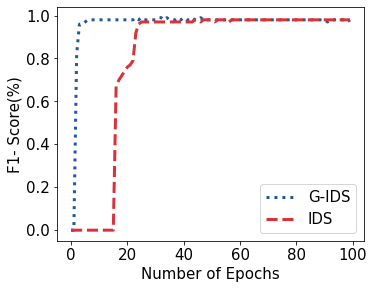

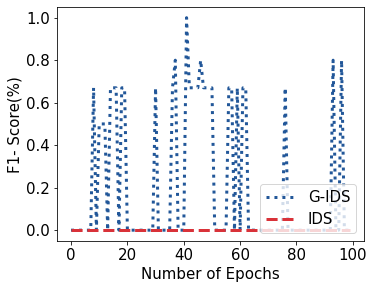

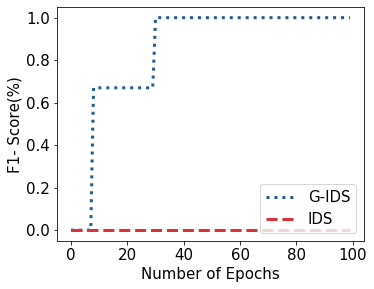

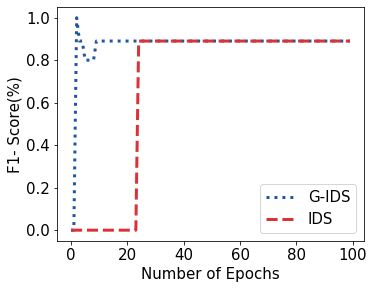

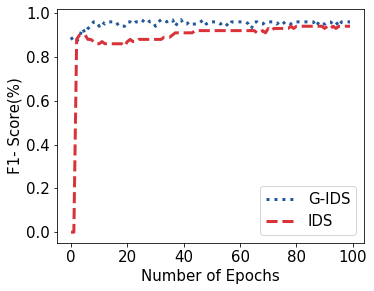

...

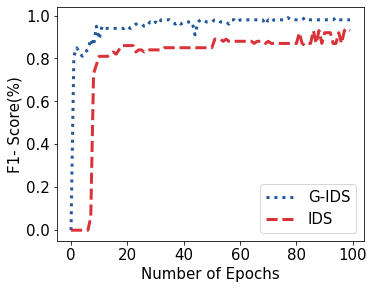

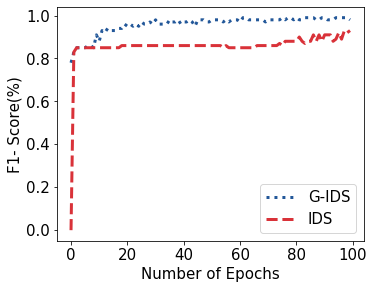

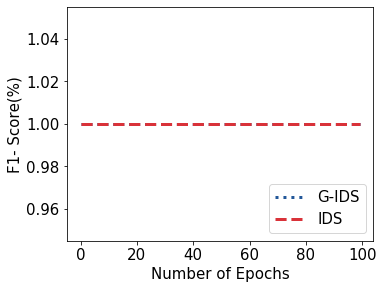

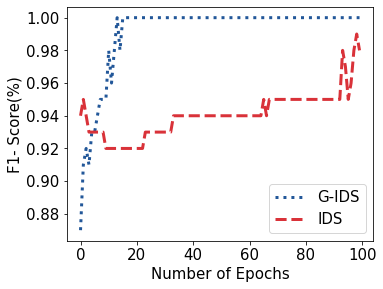

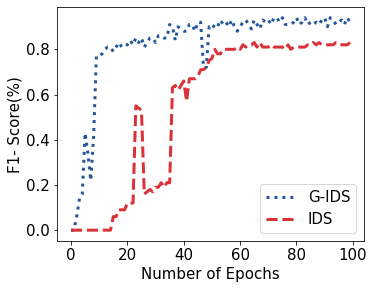

In [72]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches


def scatter_plot(file_name, label, x_axis_label, y_axis_label, data_y_before, data_y_after):
    fig=plt.figure(figsize=(5.5,4.3))
    #plt.style.use('seaborn-poster')
    #figsize=(4.4,3.4)
    font_size=15
    line_width=3
    
    
    #plt.plot(data_y_before,marker='o',markersize=2, color='#E95C46' )   
    #plt.plot(data_y_after,marker='p',markersize=2,color='#54AEAD')   
    plt.plot(data_y_after, color='#225799',linestyle=':', linewidth=line_width)   
    plt.plot(data_y_before,color='#D93239', linestyle='--' , linewidth=line_width)   
    
    
    #label
    plt.xlabel(x_axis_label, fontsize=font_size)
    plt.ylabel(y_axis_label, fontsize=font_size)
    plt.xticks(fontsize=font_size)
    plt.yticks(fontsize=font_size)
    plt.grid(False)
    
    # legends
    #red_patch=mpatches.Patch(color='#E95C46', label='Before GAN')
    #blue_patch=mpatches.Patch(color='#54AEAD', label='After GAN')
    red_patch=mpatches.Patch(color='#5E4FA1', label='Before GAN')
    blue_patch=mpatches.Patch(color='#54AEAD', label='After GAN')
    
    plt.legend (['G-IDS','IDS'],loc='lower right', fontsize=font_size)
    
    plt.grid(False)
    
    plt.show()
    fig.savefig(file_name)

for i in range(15):
    x=[]
    y=[]
    for r in Report_after:
        x.append((r[i,3]))
    for r in Report_before:
        y.append((r[i,3]))
    scatter_plot("GAN_BEFORE_AFTER/label_"+str(i)+".pdf", "","Number of Epochs", "F1- Score(%)", y[0:100], x[0:100])
    
